In [1]:
import numpy as np
import pandas as pd
import cv2
import os
import pickle
from typing import List, Tuple, Dict, Any
import eval_repeatability as er
import config_repeatability as cfg_rep
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import cv2
from mpl_toolkits.axes_grid1 import make_axes_locatable
%matplotlib inline

### Hilfsfunktionen

In [2]:
def get_normalized_stats(stats: Dict) -> Dict:
    y = stats['y'].astype('float32')
    avg = stats['avg']
    std = stats['avg']
    y_norm = np.divide(y-avg, std, out=np.zeros_like(y), where=std!=0)
    
    idx_min = np.argmin(y_norm)
    idx_max = np.argmax(y_norm)
    val_min = np.min(y_norm)
    val_max = np.max(y_norm)
    
    mean_norm = np.mean(y_norm)
    std_norm = np.std(y_norm)
    
    output = {
        'y': y_norm,
        'idx_min': idx_min,
        'idx_max': idx_max,
        'val_min': val_min,
        'val_max': val_max,
        'mean': mean_norm,
        'std': std_norm
    }
    
    return output
    

In [3]:
def get_mean_value_for_collection(
    collection_name:str,
    data:Dict,
    keys:List[str],
    color_scheme:Dict) -> None:
    
    detector_names = list(data.keys())
    
    ys = []
    colors = []
    for i, detector_name in enumerate(detector_names):
        config = data[detector_name]['_meta']['config']
        set_names = config['set_names']
        color = color_scheme[detector_name]
        colors.append(color)

        bucket_num_kpts = []
        # Put all data of all sets for this detector into the bucket
        for set_name in set_names:
            val = data[detector_name][collection_name][set_name]
            for k in keys:
                val = val.get(k, None)
            bucket_num_kpts.append(val)

        y = np.hstack(bucket_num_kpts).flatten().mean()
        ys.append(y)
    
    return ys, colors, detector_names


### Plot Funktionen

In [4]:
def plot_num_kpts_for_set(
    collection_name:str,
    set_name:str,
    data:Dict) -> None:
    
    plt.rcParams['figure.figsize'] = [16, 9]
    
    detector_names = list(data.keys())
    num_kpts = [data[detector_name][collection_name][set_name]['stats_num_kpts']['y'] for detector_name in detector_names]

    fig, ax = plt.subplots(nrows=1, ncols=1)
    
    for i, detector_name in enumerate(detector_names):
        plt.plot(np.log(num_kpts[i]), label=detector_name)
        
    ax.set_title('Anzahl gefundener Keypunkte für das Set {}'.format(set_name))
    ax.set_ylabel('Anzahl gefundener Keypunkte (log(x))')
    ax.set_xlabel('Das i-te Bild im Set.')
        
    ax.legend()

In [5]:
def plot_num_kpts_for_set_normalized(
    collection_name:str,
    set_name:str,
    data:Dict) -> None:
    
    plt.rcParams['figure.figsize'] = [16, 9]
    
    detector_names = list(data.keys())
    list_stats = [data[detector_name][collection_name][set_name]['stats_num_kpts'] for detector_name in detector_names]
    
    ys = []
    for stats in list_stats:
        ys.append(stats['y_normalized'])
        
    fig, ax = plt.subplots(nrows=1, ncols=1)
    
    for i, detector_name in enumerate(detector_names):
        ax.plot(ys[i], label=detector_name, alpha=0.8)
        
    # Find mean for all lines and draw it
    all_y = np.vstack(ys)
    avg_all = np.mean(all_y, axis=0)
    std_all = np.std(all_y, axis=0)
    
    ax.plot(avg_all, label='mean', color='red', linewidth=4, alpha=0.1)
    ax.plot(avg_all + std_all, ':')
    ax.plot(avg_all - std_all, linestyle=':')
    
        
    ax.set_title('Anzahl gefundener Keypunkte für das Set {} (normalisiert).'.format(set_name))
    ax.set_ylabel('Abweichung um die durchschnittliche Anzahl gefundener Keypunkte')
    ax.set_xlabel('Das i-te Bild im Set.')
        
    ax.legend()
    

In [6]:
def draw_image_with_min_num_kpts_for_det(
    collection_name:str,
    set_name:str,
    detector_name:str,
    cmp_detector:str,
    data:Dict,
    titles:List[str]=None,
    direction:str='horizontal',
    idx:int=None) -> None:
    """Zeige das Bild mit den wenigsten Keypunkten für den Detektor 
    `detector_name` an. Zeige das gleich Bild für den Vergelichs-
    Detektor `cmp_detector` an.
    
    collection_name  -- Name der Bild-Kollektion.
    set_name         -- Name des Sets innerhalb der Kollektion.
    detector_name    -- Name des Detektors, dessen Keypunktbild geladen werden soll.
    cmp_detector     -- Name des Vergleichsdetektors, dessen Keypunktbild geladen werden soll.
    data             -- Objekt, dass die Daten der einzelnen Detektoren beinhaltet.
    titles           -- Title für die beiden Bilder.
    directions       -- horizontal | vertical. Ausrichtung der beiden Bilder.
    idx              -- Anstatt das Bild mit den wenigsten Keypunkten zu nehmen, nimm das idx-te Bild.
    """
    
    # Load config for `detector_name`.
    _config = data[detector_name]['_meta']['config']
    
    stats = data[detector_name][collection_name][set_name]['stats_num_kpts']
    idx_min = stats['idx_min']
    
    if idx is not None:
        idx_min = idx
    
    # Find the one image, where detector has problem
    config = data[detector_name]['_meta']['config']
    image_dir = config['image_dir']
    set_dir = os.path.join(image_dir, collection_name, set_name)
    image_files = sorted(os.listdir(set_dir))
    image_name = image_files[idx_min]
    img_base, _ = os.path.splitext(image_name)
    
    # Find the image with keypoints drawn into it
    data_dir = config['data_dir']
    kp_img_dir = os.path.join(data_dir, collection_name, set_name, 'keypoint_images')
    kp_det_dir = os.path.join(kp_img_dir, detector_name)
    kp_cmp_dir = os.path.join(kp_img_dir, cmp_detector)
    
    
    # Get image path
    img_org_path = os.path.join(set_dir, image_files[idx_min])
    img_det_path = os.path.join(kp_det_dir, _config['kpts_image_format'].format(img_base, _config['max_size']))
    img_cmp_path = os.path.join(kp_cmp_dir, _config['kpts_image_format'].format(img_base, _config['max_size']))
    
    # Load images
    img_org = cv2.imread(img_org_path)
    img_det = cv2.imread(img_det_path)
    img_cmp = cv2.imread(img_cmp_path)
    
    if direction == 'horizontal':
        plt.rcParams['figure.figsize'] = [16, 16]
        fig, axes = plt.subplots(nrows=1, ncols=2)
    else:
        plt.rcParams['figure.figsize'] = [16, 6]
        fig, axes = plt.subplots(nrows=2, ncols=1)
    
    if titles is None or len(titles) != 2:
        titles=['', '']
    
    ax = axes[0]
    ax.imshow(img_det)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(titles[0].format(idx_min))
    
    ax = axes[1]
    ax.imshow(img_cmp)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(titles[1].format(idx_min))

In [7]:
def plot_perc_matching_kpts_for_e(
    collection_name:str,
    set_name:str,
    data:Dict,
    epsilon=1) -> None:
    
    plt.rcParams['figure.figsize'] = [16,9]
    
    detector_names = list(data.keys())
    ys = [data[detector_name][collection_name][set_name]['stats_perc_matching_kpts_for_e_{}'.format(epsilon)]['y'] for detector_name in detector_names]

    fig, ax = plt.subplots(nrows=1, ncols=1)
    
    for i, detector_name in enumerate(detector_names):
        plt.plot(ys[i], label=detector_name)
        
    ax.set_title('Prozentsatz wiederholbarer Keypunkte für das Set {}'.format(set_name))
    ax.set_ylabel('Prozent')
    ax.set_xlabel('Das i-te Bild im Set.')
        
    ax.legend()

In [8]:
def plot_perc_matching_kpts_for_e_normalized(
    collection_name:str,
    set_name:str,
    data:Dict,
    epsilon=1) -> None:
    """Draw the normalized percentage to see where the detector performed
    over or under average."""
    
    plt.rcParams['figure.figsize'] = [16,9]
    
    detector_names = list(data.keys())
    list_stats = [data[detector_name][collection_name][set_name]['stats_perc_matching_kpts_for_e_{}'.format(epsilon)] for detector_name in detector_names]

    ys = []
    for stats in list_stats:
        ys.append(stats['y_normalized'])
        
    fig, ax = plt.subplots(nrows=1, ncols=1)
    
    for i, detector_name in enumerate(detector_names):
        ax.plot(ys[i], label=detector_name, alpha=0.8)
     
    # Find mean for all lines and draw it
    all_y = np.vstack(ys)
    avg_all = np.mean(all_y, axis=0)
    std_all = np.std(all_y, axis=0)
    
    ax.plot(avg_all, label='mean', color='red', linewidth=4, alpha=0.1)
    ax.plot(avg_all + std_all, ':')
    ax.plot(avg_all - std_all, linestyle=':')
        
    ax.set_title('Normalisiert Prozentsatz wiederholbarer Keypunkt im Set {}'.format(set_name))
    ax.set_ylabel('Normalisierter Prozentsatz')
    ax.set_xlabel('Das i-te Bild im Set.')
        
    ax.legend()

In [9]:
def plot_nth_image(
    collection_name:str,
    set_name:str,
    data:Dict,
    idx:int,
    title:str=None) -> None:
    
    plt.rcParams['figure.figsize'] = [16, 9]
    
    config = data[list(data.keys())[0]]['_meta']['config']
    
    image_dir = config['image_dir']
    set_dir = os.path.join(image_dir, collection_name, set_name)
    image_files = sorted(os.listdir(set_dir))
    image_name = image_files[idx_min]
    
    # Load image
    im = cv2.imread(os.path.join(set_dir, image_name))
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    
    fig, ax = plt.subplots(nrows=1, ncols=1)
    
    ax.imshow(im)
    ax.set_xticks([])
    ax.set_yticks([])
    if title is not None:
        ax.set_title(title.format(idx))


In [10]:
def plot_difference_in_variance_for_matching_kpts_for_e(
    collection_name:str,
    set_name:str,
    data:Dict,
    color_scheme:Dict,
    epsilon:int=1) -> None:
    
    plt.rcParams['figure.figsize'] = [16, 9]
    
    detector_names = list(data.keys())
    
    variances = []
    colors = []
    for i, detector_name in enumerate(detector_names):
        stats = data[detector_name][collection_name][set_name]['stats_perc_matching_kpts_for_e_{}'.format(epsilon)]
        variances.append(stats['variance'])
        colors.append(color_scheme[detector_name])
        
    variances = np.array(variances)
    detector_names = np.array(detector_names)
    colors = np.array(colors)
    
    # Sort by values, ascending
    sorted_indices = np.argsort(variances)
    
    variances = variances[sorted_indices]
    detector_names = detector_names[sorted_indices]
    colors = colors[sorted_indices]
        
    fig, ax = plt.subplots(nrows=1, ncols=1)
    
    ax.bar(detector_names, variances,color=colors)
    ax.set_title('Absolute Schwankung der prozentualen Wiederholbareit im Set {}'.format(set_name))
        

In [11]:
def plot_difference_in_variance_for_num_kpts(
    collection_name:str,
    set_name:str,
    data:Dict,
    color_scheme:Dict) -> None:
    
    plt.rcParams['figure.figsize'] = [16, 9]
    
    detector_names = list(data.keys())
    
    variances = []
    colors = []
    for i, detector_name in enumerate(detector_names):
        stats = data[detector_name][collection_name][set_name]['stats_num_kpts']
        variances.append(stats['variance'])
        colors.append(color_scheme[detector_name])
        
    variances = np.array(variances)
    detector_names = np.array(detector_names)
    colors = np.array(colors)
    
    # Sort by values, ascending
    sorted_indices = np.argsort(variances)
    
    variances = variances[sorted_indices]
    detector_names = detector_names[sorted_indices]
    colors = colors[sorted_indices]
        
    fig, ax = plt.subplots(nrows=1, ncols=1)
    
    ax.bar(detector_names, variances,color=colors)
    ax.set_title('Absolute Schwankung der normalisierten Anzahl gefundener Keypunkte im Set {}'.format(set_name))
        

In [12]:
def plot_comparison(
    collection_name:str,
    data:Dict,
    color_scheme:Dict
) -> None:
    
    plt.rcParams['figure.figsize'] = [16, 8]

    fig, axes = plt.subplots(nrows=1, ncols=2)

    # PLOT LEFT
    ax = axes[0]

    ys, colors, detector_names = get_mean_value_for_collection(
        collection_name, data, ['stats_num_kpts', 'y'], COLOR_SCHEME)

    for i, _ in enumerate(detector_names):
        ax.text(i - 0.35, 
                ys[i] + 20,
                '{0:.2f}'.format(ys[i]),
                color=colors[i],
                fontsize=14)

    ax.bar(detector_names, ys, label=detector_names, color=colors);
    ax.set_title('{}: Durchschnittliche Anzahl gefundener'.format(collection_name))

    # PLOT RIGHT
    ax = axes[1]

    ys, colors, detector_names = get_mean_value_for_collection(
        collection_name, data, ['stats_perc_matching_kpts_for_e_1', 'y'], COLOR_SCHEME)

    for i, _ in enumerate(detector_names):
        ax.text(i - 0.25, 
                ys[i] + 0.005,
                '{0:.4f}'.format(ys[i]),
                color=colors[i],
                fontsize=14)

    ax.bar(detector_names, ys, label=detector_names, color=colors);
    ax.set_title('{}: Durchschnittliche Wiederholbarkeit'.format(collection_name));

### Settings

In [13]:
detector_names = ['sift', 'lift', 'tilde', 'superpoint', 'tcovdet']

In [14]:
dir_output = '../../output_evaluation/detectors'
data_paths = [os.path.join(dir_output, '{}.pkl'.format(detector_name)) for detector_name in detector_names]

In [15]:
data = {}
for d_name, d_path in zip(detector_names, data_paths):
    with open(d_path, 'rb') as src:
        data[d_name] = pickle.load(src, encoding='utf-8')

In [16]:
data.keys()

dict_keys(['sift', 'lift', 'tilde', 'superpoint', 'tcovdet'])

In [17]:
config = data['sift']['_meta']['config']
fs = data['sift']['_meta']['file_system']
plt.rcParams['figure.figsize'] = [16, 9]

In [18]:
COLOR_SCHEME = {
    'sift': '#1f77b4',
    'lift': '#ff7f0e',
    'tilde': '#2ca02c',
    'superpoint': '#d62728',
    'tcovdet': '#9467bd'
}

## Kollektion: Webcam

In [19]:
collection_name = 'webcam'

### Chamonix

In [20]:
set_name = 'chamonix'

Diese Graphik zeigt die Anzahl der gefundene Keypunkte für dieses Set. Die y-Werte wurden aus Anschaulichkeitszwecken logarithmiert .

#### Anzahl gefundener Keypunkte

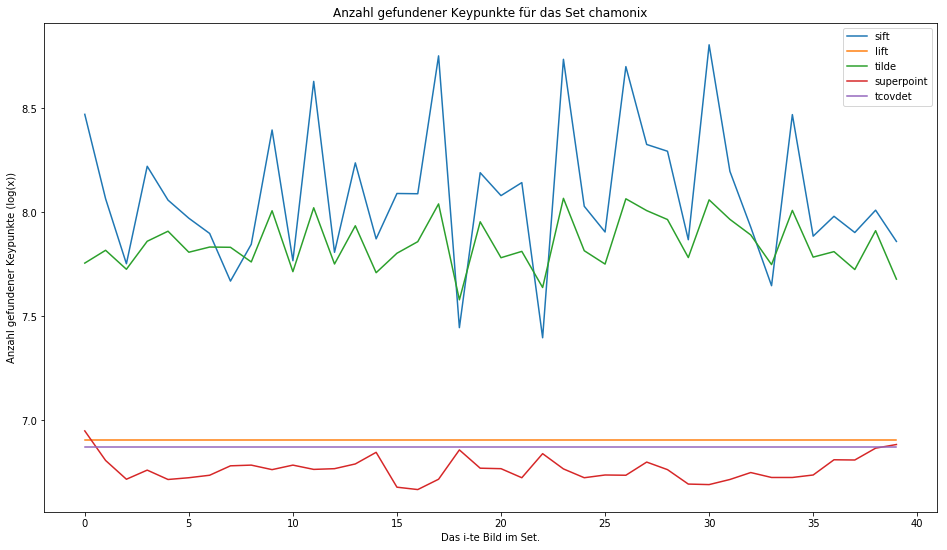

In [21]:
plot_num_kpts_for_set(collection_name, set_name, data)

In der normalisierten Form, das heisst nach Abzug des jewiligen Durchschnittes und der Teilung durch die Standardabweichung sieht man, bei welchem Bild der jeweilige Detektor Probleme hatte und bei welchen Bildern er überdurchschnittliche gut arbeitete.

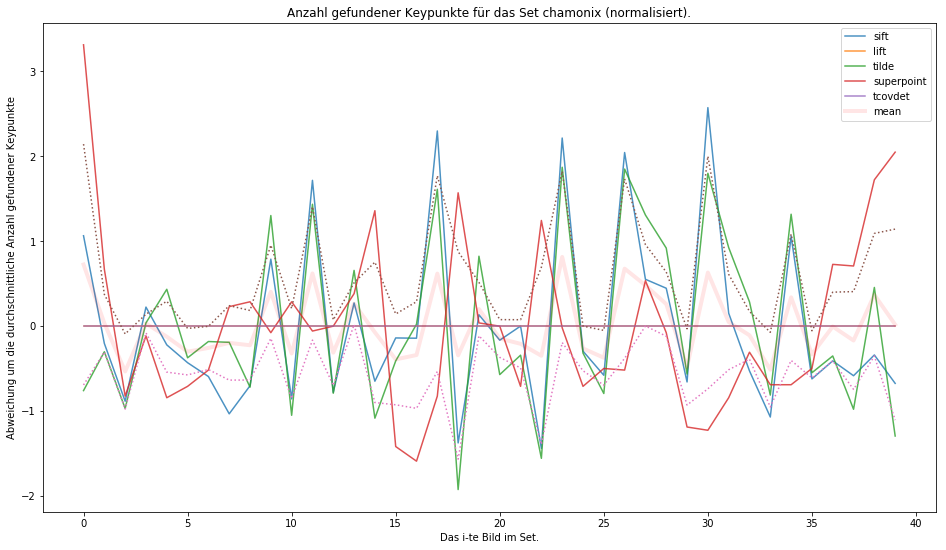

In [22]:
plot_num_kpts_for_set_normalized(collection_name, set_name, data)


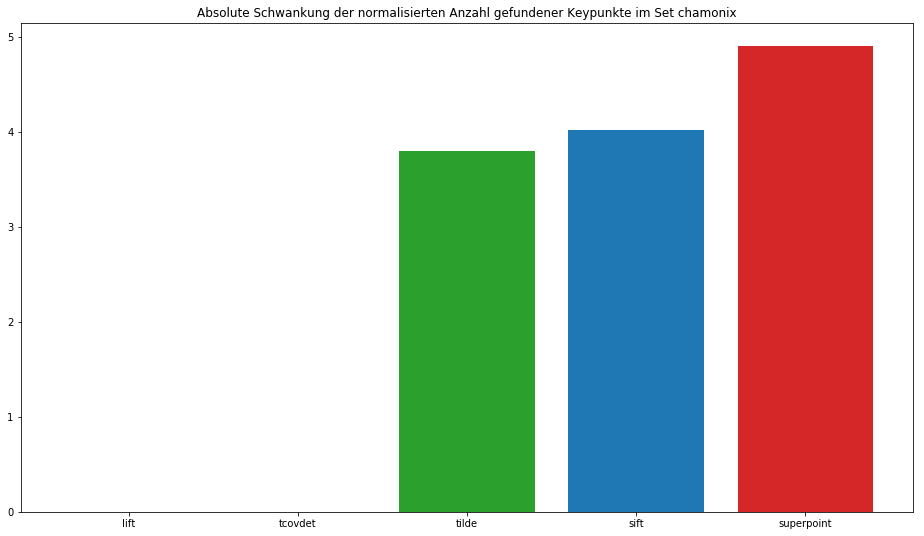

In [23]:
plot_difference_in_variance_for_num_kpts(
    collection_name, set_name, data, COLOR_SCHEME)

#### Beobachtung: 
- LIFT$_{1k}$ und TCovDet$_{1k}$ scheinen beide konsistent gleich gut über alle Bilder hinweg zu arbeiten, was die Anzahl der gefundenen Keypunkte angeht. Dies ist nicht verwunderlich, da deren maximal Rückgabe an Keypunkten als Parameter festgelegt wird. In beiden Fällen ist er bei ungefähr 1000.
- SIFT und TILDE verhalten sich sehr ähnlich, das heißt, beide Detektoren zeigen bei den gleichen Bildern die gleichen Eigenschaften wenn es um die Anzahl der Keypunkte geht. Der einzige Unterschied scheint dabei tatsächlich nur die Anzahl der Keypunkte zu sein.
- Eine Besonderheit stellt SuperPoint dar: SuperPoint scheint generell gleich viele Keypunkte pro Bild zu finden, jedoch weniger als LIFT$_{1k}$ und TCovDet$_{1k}$, was die geringen Schwankungen andeuten. Interessant ist jedoch, dass sich SuperPoint an vielen Stellen reziprok zu SIFT und TILDE verhält in dem Sinne, dass es durchschnittliche mehr Keypunkte bei Bildern findet, bei denen SIFT und TILDE unterdurchschnittlich performen. Und bei Bildern, bei denen SIFT und TILDE sehr viele Keypunkte ausmachen, neigt SuperPoint dazu, unterdurchschnittlich viele Keypunkte auszumachen.
- Ebenfalls interessant ist, dass SuperPoint in Gegensatz zu den anderen Detektoren gerade bei dem ersten und letzten Bild des Sets für die eigenen Verhältnisse besonders gut operiert.
- Letzendlich aber zeigt sich, dass SuperPoint von alle Detektoren doch die stärksten Schwankungen bezüglich der absoluten Anzahl gefundenener Keypunkte im Set hat.

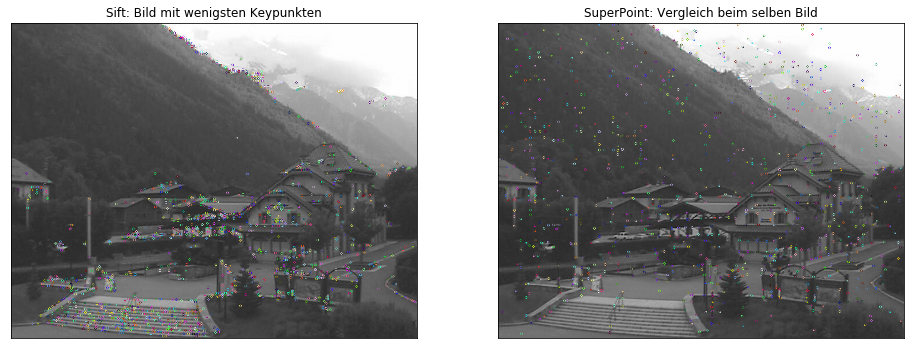

In [24]:
draw_image_with_min_num_kpts_for_det(
    collection_name, 
    set_name, 
    'sift',  
    'superpoint', 
    data,
    titles=['Sift: Bild mit wenigsten Keypunkten', 
           'SuperPoint: Vergleich beim selben Bild'])

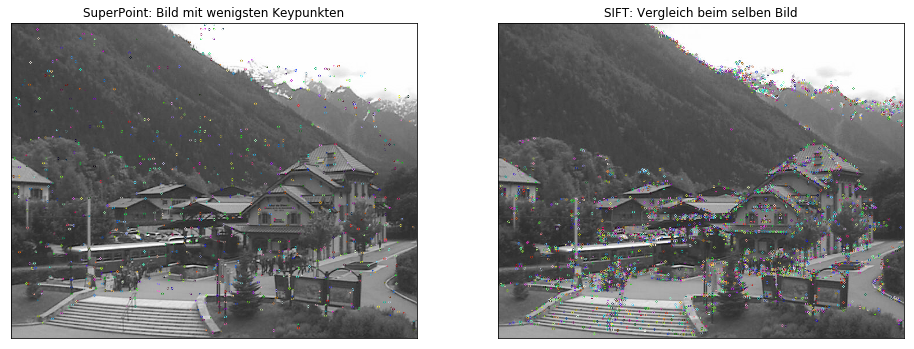

In [25]:
draw_image_with_min_num_kpts_for_det(
    collection_name, 
    set_name, 
    'superpoint',  
    'sift', 
    data,
    titles=['SuperPoint: Bild mit wenigsten Keypunkten', 
           'SIFT: Vergleich beim selben Bild'])

#### Prozentsatz passender Keypunkte

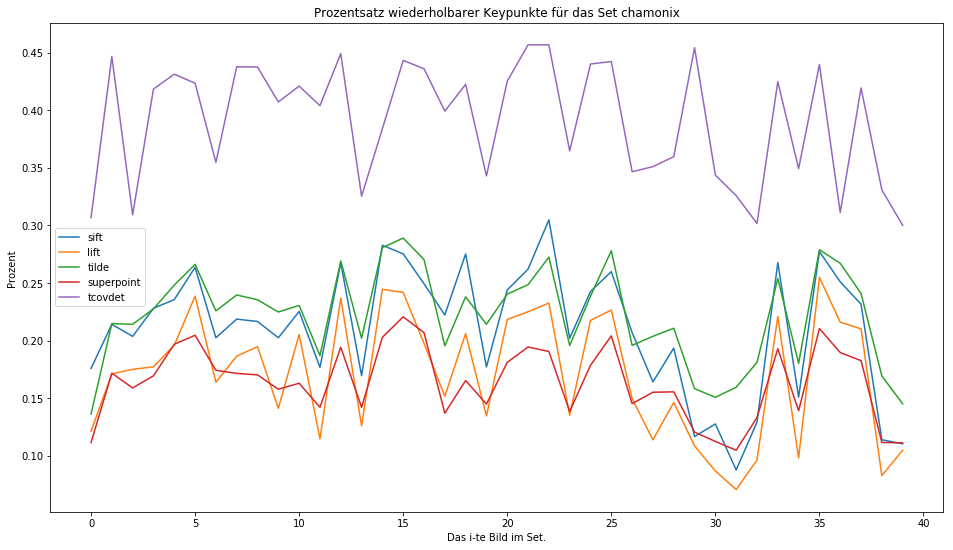

In [26]:
plot_perc_matching_kpts_for_e(collection_name, set_name, data)

#### Beobachtung
- SIFT, TILDE, LIFT$_{1k}$ und SuperPoint performen alle gleich gut, trotz stark unterschiedlicher Anzahl an Keypunkten.
- TCovDet$_{1k}$ hingegen überrascht durch eine deutlich höhere prozentuale Wiederholbarkeit seiner Keypunkte gegenüber den anderen Detektoren.
- Alle Detektoren weisen ungefähr das gleich Verhalten bei den Bildern im Set auf.
- Schwankungen bei der Wiederholbarkeit befindent sich im Bereich von bis zu 15%.

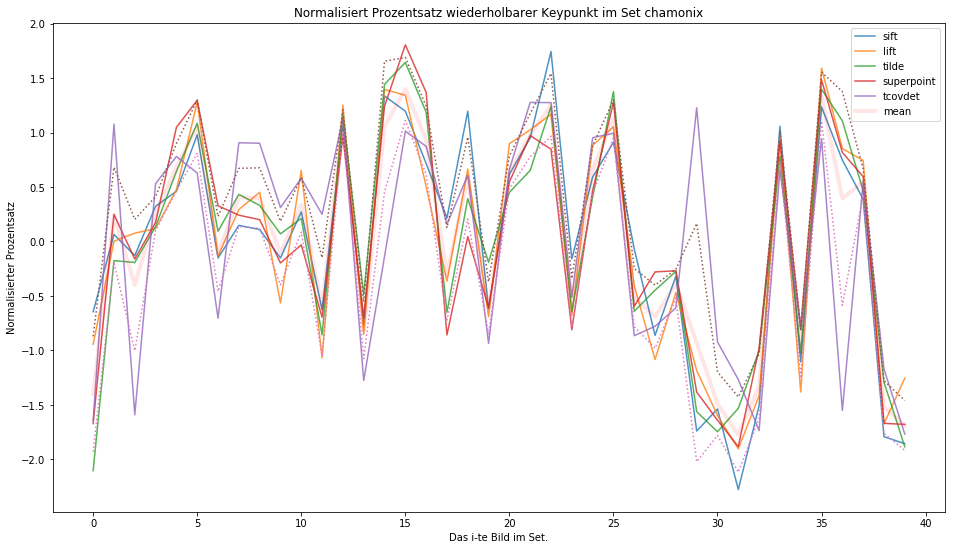

In [27]:
plot_perc_matching_kpts_for_e_normalized(
    collection_name, set_name, data)

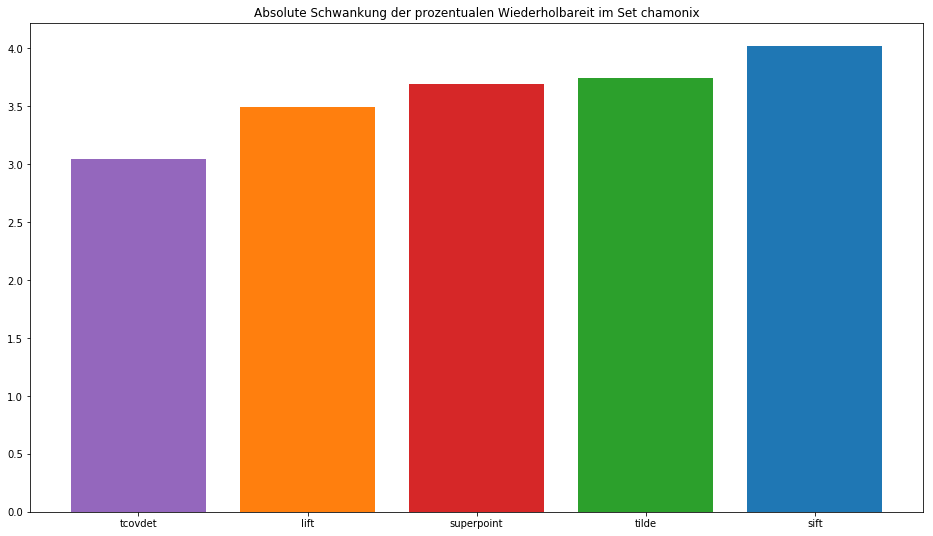

In [28]:
plot_difference_in_variance_for_matching_kpts_for_e(
    collection_name, set_name, data, COLOR_SCHEME)

#### Beobachtung
- Das Verhalten der Detektoren ist bei den jeweiligen Bildern sehr ähnglich, das heißt, grundsätzlich matchen die Detektoren die gleichen Keypunktsets überdurchschnittlich gut oder schlecht.
- Auffällig ist TCovDet$_{1k}$ bei den Bildern mit dem Index 29 und 36. Beim ersteren matcht TCovDet$_{1k}$ übermäßig gut während die anderen Detektoren einen starken Abfall von bis zu -0.6 vorweisen (LIFT$_{1k}$, SIFT). Bei den Keypunkten aus dem Bild mit dem Index 36 sieht es genau andersherum aus. Hier können all Detektoren die aus dem Bild gewonnenen Keypunkte überdurchschnittlich gut wiederholen, während TCovDet$_{1k}$ unterdurchschnittlich performt.

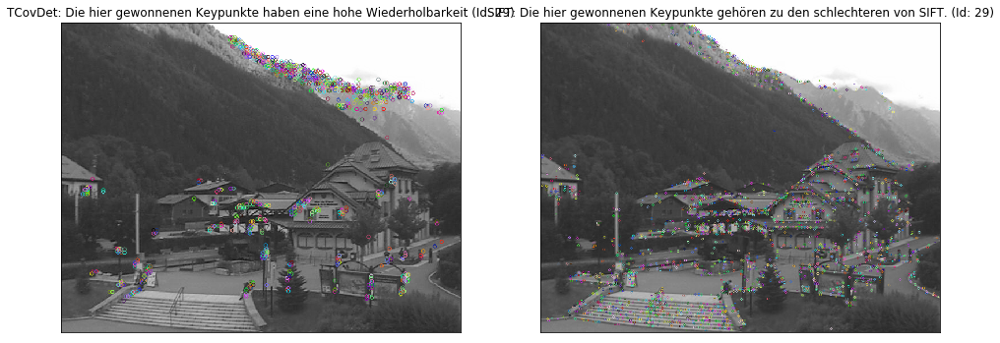

In [29]:
draw_image_with_min_num_kpts_for_det(
    collection_name, 
    set_name, 
    'tcovdet',  
    'sift', 
    data,
    idx=29,
    titles=['TCovDet: Die hier gewonnenen Keypunkte haben eine hohe Wiederholbarkeit (Id: {})', 
           'SIFT: Die hier gewonnenen Keypunkte gehören zu den schlechteren von SIFT. (Id: {})'])

### Courbevoie

In [30]:
set_name = 'courbevoie'

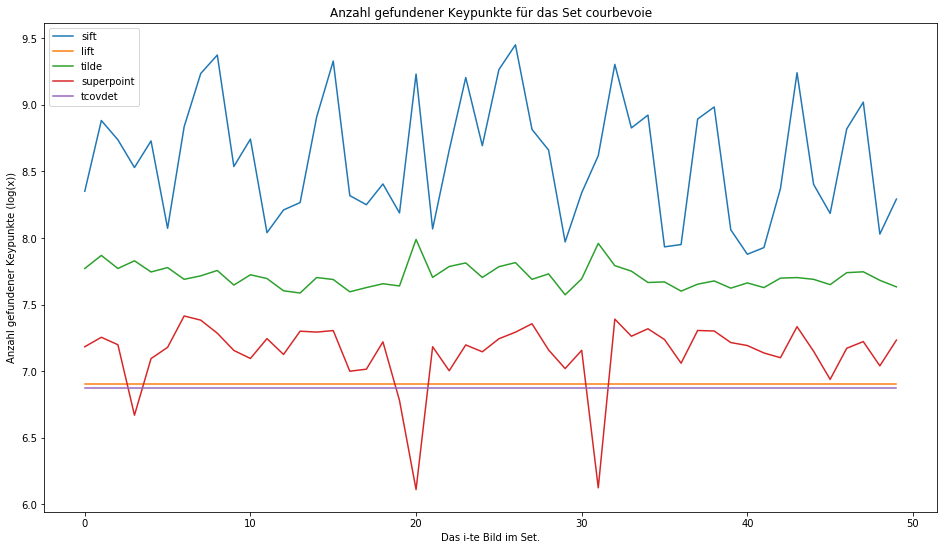

In [31]:
plot_num_kpts_for_set(collection_name, set_name, data)

#### Beobachtung
- Im Gegensatz zum Chamonix Set findet hier eine klare Dreiteilung bei der Anzahl gefundener Keypunkte statt. SIFT führt deutlich, gefolgt von  TILDE und dann SuperPoint.
- Zu keinem Zeitpunkt hat TILDE mehr Keypunkte gefunden als SIFT, dies ist beim Chamonix Set noch anders.
- SuperPoint kam mit dem Set deutlich besser klar als noch bei Chamonix: So findet der der SuperPoint Detektor nun durchschnittlich mehr Keypunkte als TCovDet$_{1k}$ und LIFT$_{1k}$.
- An drei Stellen bricht die Performanz von SuperPoint deutlich ein, sodass der Detektor dort auch weniger als 1000 Keypunkte findet. Dies ist besonders interessant, da an den gliechen Stellen TILDE und SIFT einene deutlichen Anstiegt an gefundenen Keypunkten vermerken.

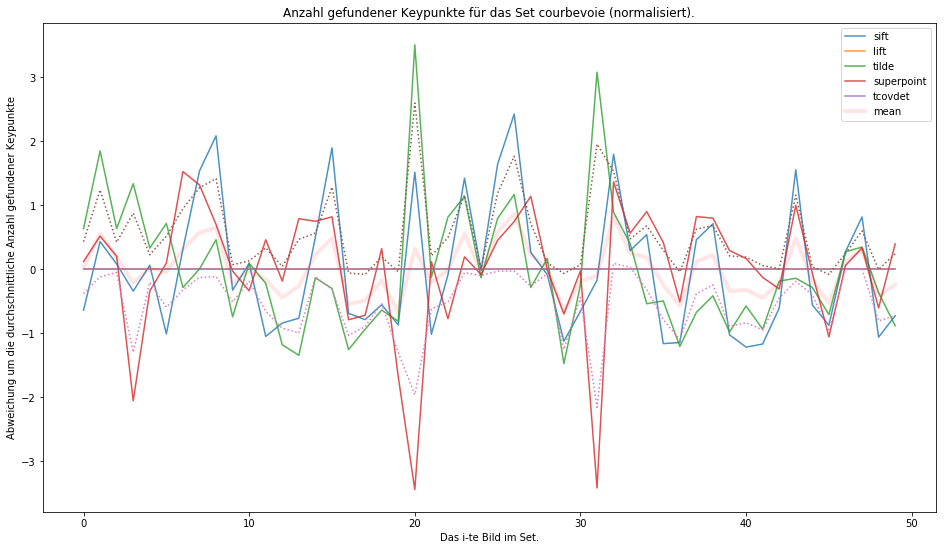

In [32]:
plot_num_kpts_for_set_normalized(collection_name, set_name, data)

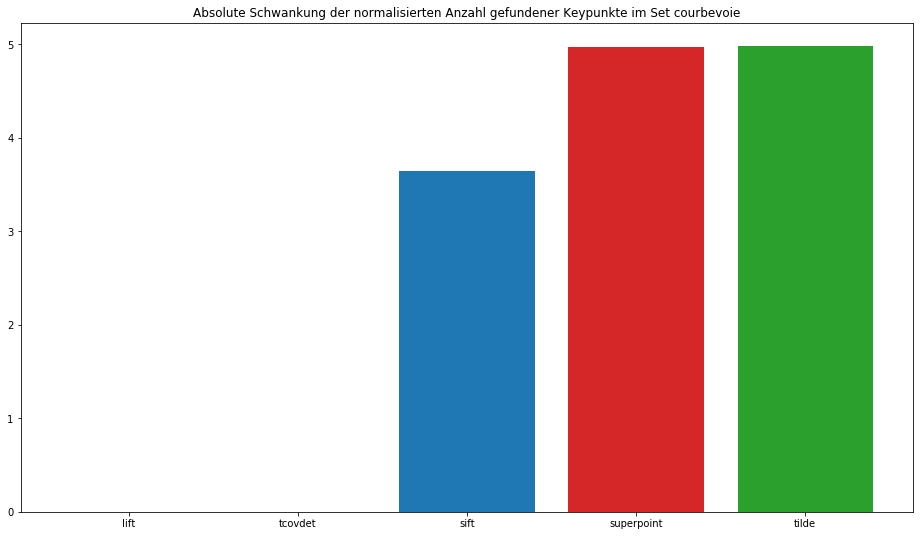

In [33]:
plot_difference_in_variance_for_num_kpts(
    collection_name, set_name, data, COLOR_SCHEME)

#### Beobachtung:
- Auffällig sind hier, wie oben schon angemerkt, die drei negativen Spitzen des SuperPoint Detektors und dass der Detektor sonst recht stabil auf diesem Bilderset arbeitet.
- Auffällig ist darüber hinaus, dass SIFT und TILDE genau bei den Negativspitzen von SuperPoint ingesamt mehr Keypunkte finden und für die eigenen Verhältnisse auf genau den Bildern besser operieren.
- Wie auch schon bei Chamonix zeigt sich, dass SIFT sehr sensible auf Veränderungen im Bild reagiert und dies sich direkt auf die Anzahl gefundener Keypunkte auswirkt, hier deutlich zu sehen an den starken Schwankungen der SIFT Kurve.
- Die anderen beiden Detektoren (TCovDet$_{1k}$ und LIFT$_{1k}$) dagegen finden konstant gleich viele Keypunkte, unabhängig vom Bild.

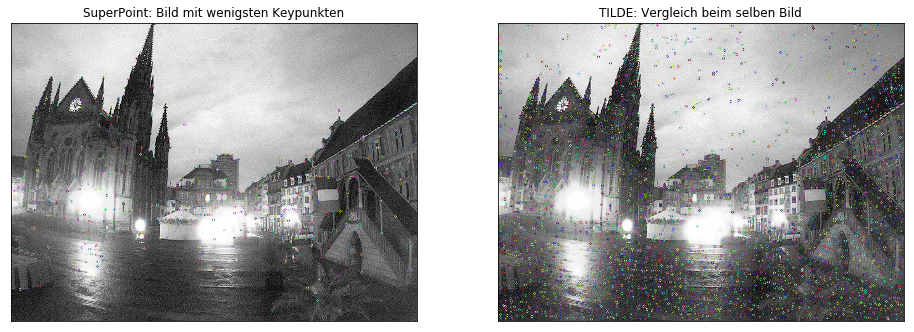

In [34]:
draw_image_with_min_num_kpts_for_det(
    collection_name, 
    set_name, 
    'superpoint',  
    'tilde', 
    data,
    titles=['SuperPoint: Bild mit wenigsten Keypunkten', 
           'TILDE: Vergleich beim selben Bild'])

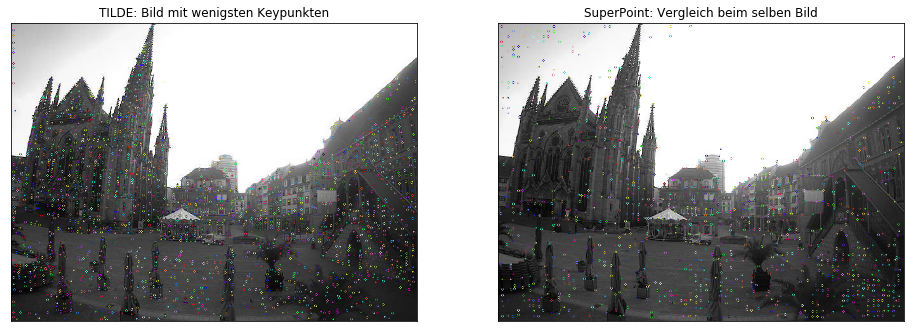

In [35]:
draw_image_with_min_num_kpts_for_det(
    collection_name, 
    set_name, 
    'tilde',  
    'superpoint', 
    data,
    titles=['TILDE: Bild mit wenigsten Keypunkten', 
           'SuperPoint: Vergleich beim selben Bild'])

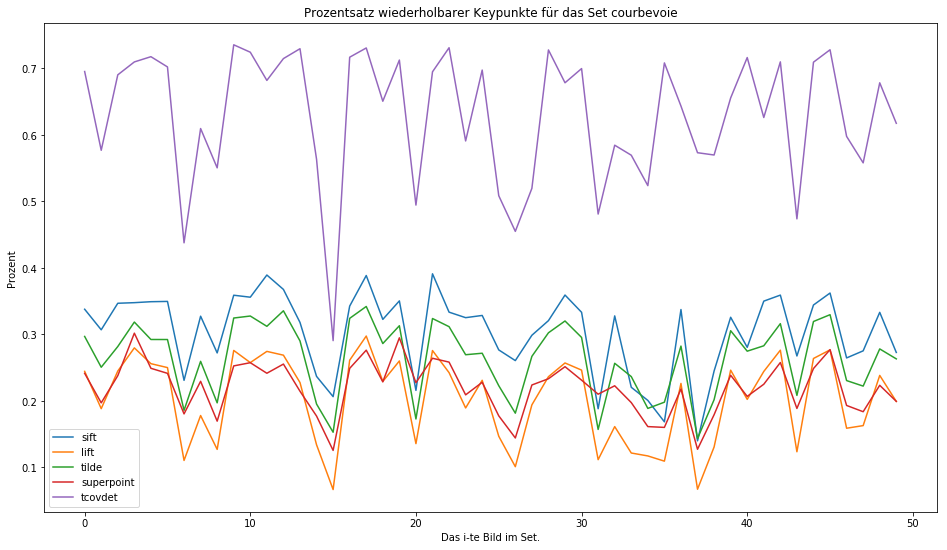

In [36]:
plot_perc_matching_kpts_for_e(collection_name, set_name, data)

In [37]:
stats_tcovdet = data['tcovdet'][collection_name][set_name]['stats_perc_matching_kpts_for_e_1']
diff_tcovdet = stats_tcovdet['val_max'] - stats_tcovdet['val_min']
print('Bei TCovDet gibt es Wiederholbarkeitsschwankungen von bis zu {0:.2f}%!'.format(100*diff_tcovdet))

Bei TCovDet gibt es Wiederholbarkeitsschwankungen von bis zu 44.49%!


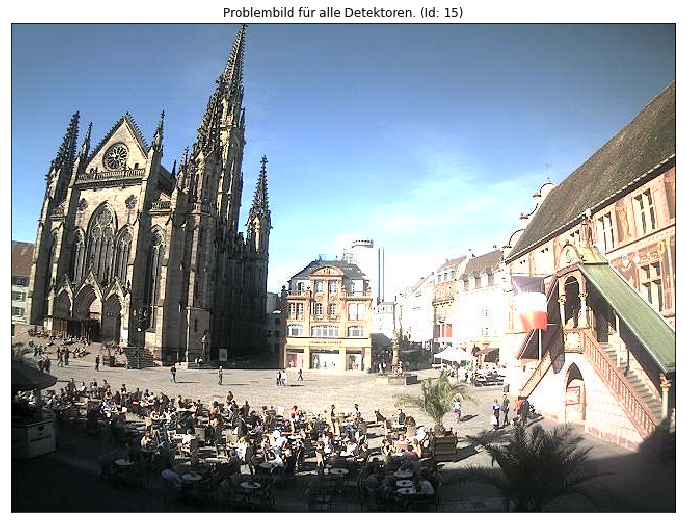

In [38]:
stats = data['tcovdet'][collection_name][set_name]['stats_perc_matching_kpts_for_e_1']
stats_norm = get_normalized_stats(stats)
idx_min = stats_norm['idx_min']
plot_nth_image(collection_name, set_name, data, idx_min, title='Problembild für alle Detektoren. (Id: {})')

#### Beobachtung
- TCovDet$_{1k}$ weist wiederherum die besten Wiederholbarkeitswerte auf, obwohl es hier zwischen den Keypunktsets der einzelnen Bilder deutlich Unterschiede von fast 44.5% gibt!
- Trotz unterschiedlicher Anzahl gefundener Keypunkte verhalten sich die anderen Detektoren sehr ähnlich.
- LIFT$_{1k}$ besitzt die gleiche Anzahl an Keypunkten wie TCovDet$_{1k}$, performt aber von allen Detektoren hier am schlechtesten.
- Alle Detektoren haben Probleme mit den Keypunkten aus dem 16-ten. Zwar finden alle Detektoren genügend Keypunkte, diese lassen sich aber schwerlich mit denen aus anderen Bildern zusammenführen. Grund dafür scheint der starke Kontrast in dem Bild zu sein: Harte Schatten und sehr helle Lichtreflektionen sowie ein recht wolkenloser Himmel tragen zu disesem Problem bei.

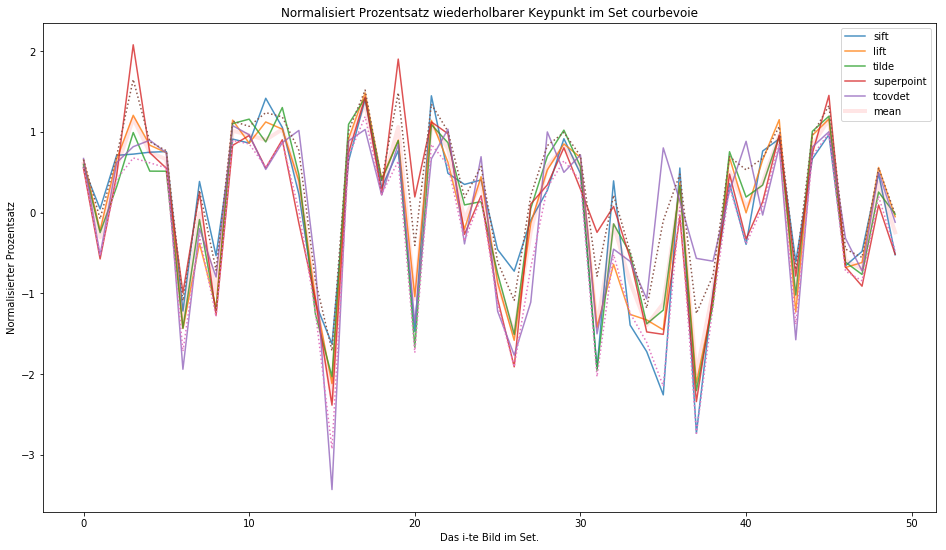

In [39]:
plot_perc_matching_kpts_for_e_normalized(
    collection_name, set_name, data)

### Beobachtungen
- Die Wiederholbarkeit der Keypunkte aus jedem Bild verhält sich grundlegend gleich für alle Detektoren bei diesem Set.
- SuperPoint und TCovDet$_{1k}$ fallen durch ihre Extrema im Bereich Wiederholbarkeit auf, sodass es nicht verwunderlich ist, dass sie größten Varianzwerte besitzen.
- Im Gegensatz zum vorherigen Set, matcht TCovDet$_{1k}$ nicht mehr so konsistent, was aber zum großen Teil an dem 16 Bild, dass die generelle Performanz aller Detektoren negativ beinträchtigt.

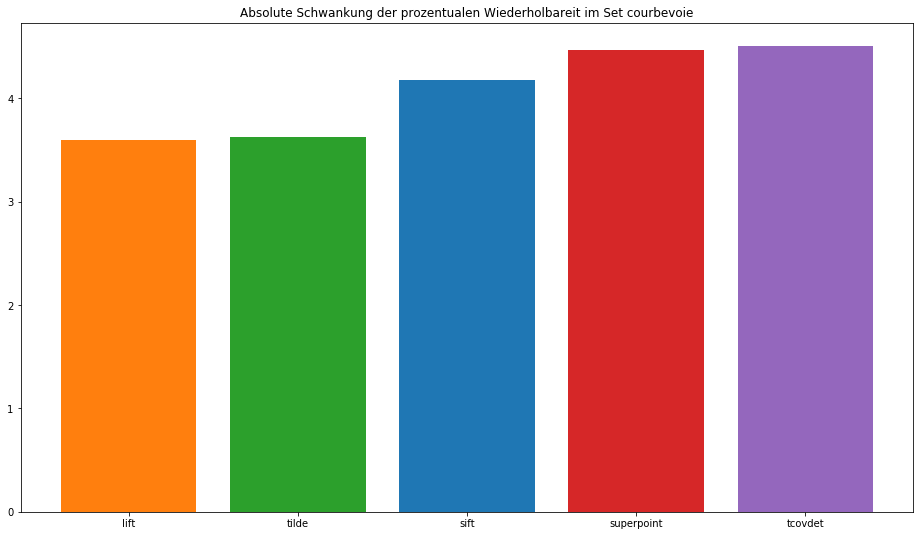

In [40]:
plot_difference_in_variance_for_matching_kpts_for_e(
    collection_name, set_name, data, COLOR_SCHEME)

### frankfurt

In [41]:
set_name = 'frankfurt'

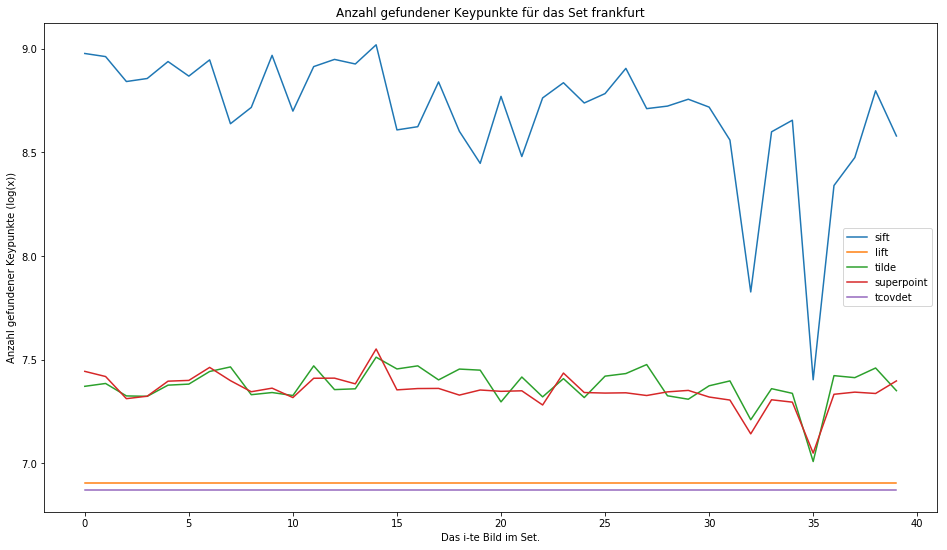

In [42]:
plot_num_kpts_for_set(collection_name, set_name, data)

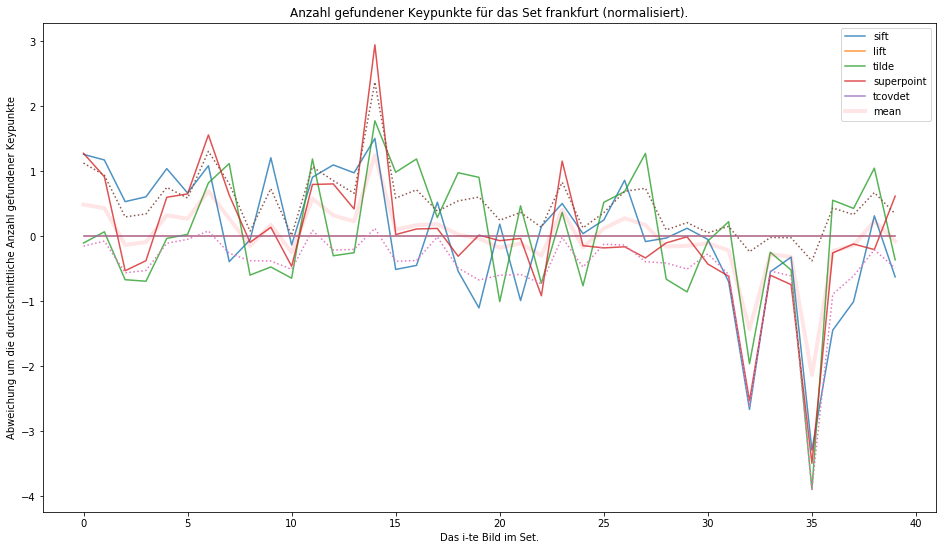

In [43]:
plot_num_kpts_for_set_normalized(collection_name, set_name, data)

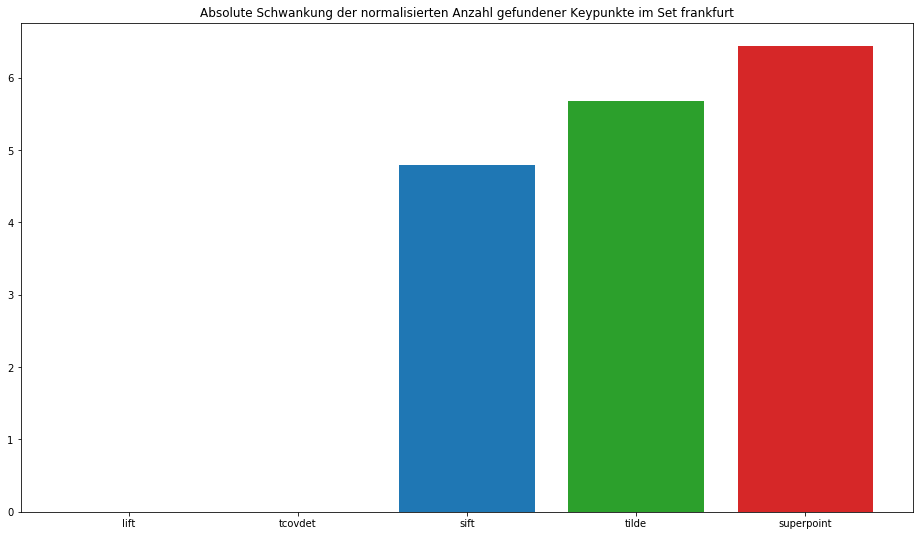

In [44]:
plot_difference_in_variance_for_num_kpts(collection_name, set_name, data, COLOR_SCHEME)

### Beobachtung
- Bei der Anzahl der gefundenen Keypunkte sticht in diesem Set SIFT deutlich hervor.
- SuperPoint und TILDE hingegen verhalten sich  im Bezug auf die Anzahl der Keypunkte sehr ähnlich.
- Zwei Bilder im Set und deren daraus gewonnenen Keypunkte stellen ein Problem für die Detektoren SIFT, TILD und SuperPoint da. Dies ist jedoch nicht verwunderlich, da es sich dabei um eine sehr nebelige Nachtaufnahme handelt, wie unten zu erkennen ist.

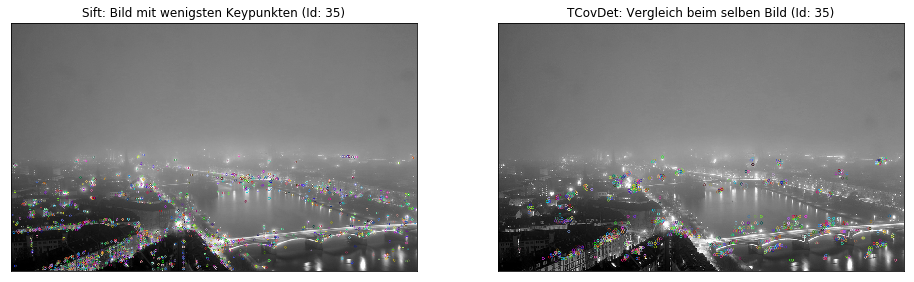

In [45]:
draw_image_with_min_num_kpts_for_det(
    collection_name, 
    set_name, 
    'sift',  
    'tcovdet', 
    data,
    titles=['Sift: Bild mit wenigsten Keypunkten (Id: {})', 
           'TCovDet: Vergleich beim selben Bild (Id: {})'])

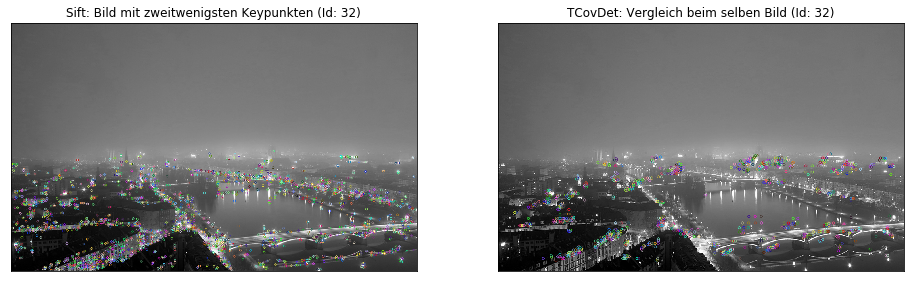

In [46]:
stats = data['sift'][collection_name][set_name]['stats_num_kpts']
stats_norm = get_normalized_stats(stats)
idx_min = stats_norm['y'].argsort()

draw_image_with_min_num_kpts_for_det(
    collection_name, 
    set_name, 
    'sift',  
    'tcovdet', 
    data,
    idx=idx_min[1],
    titles=['Sift: Bild mit zweitwenigsten Keypunkten (Id: {})', 
           'TCovDet: Vergleich beim selben Bild (Id: {})'])

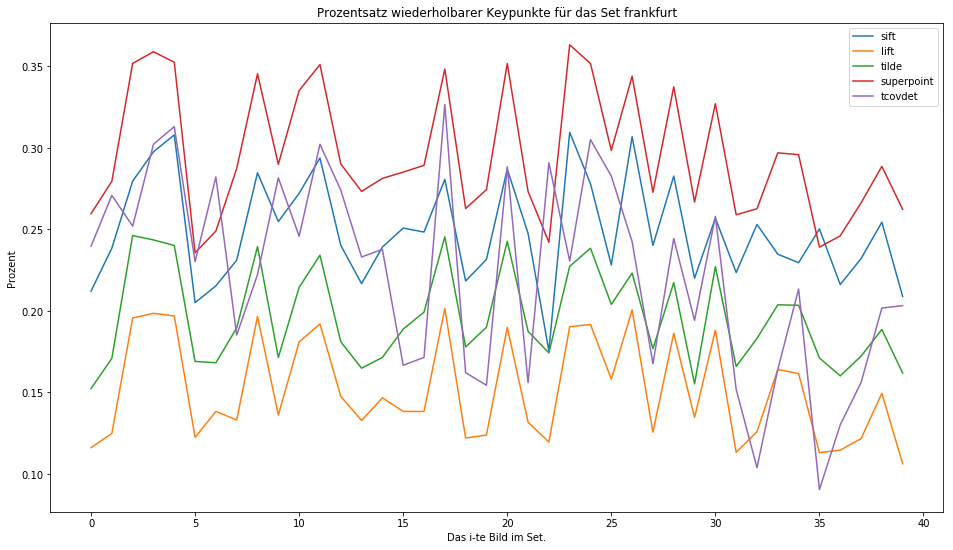

In [47]:
plot_perc_matching_kpts_for_e(collection_name, set_name, data)

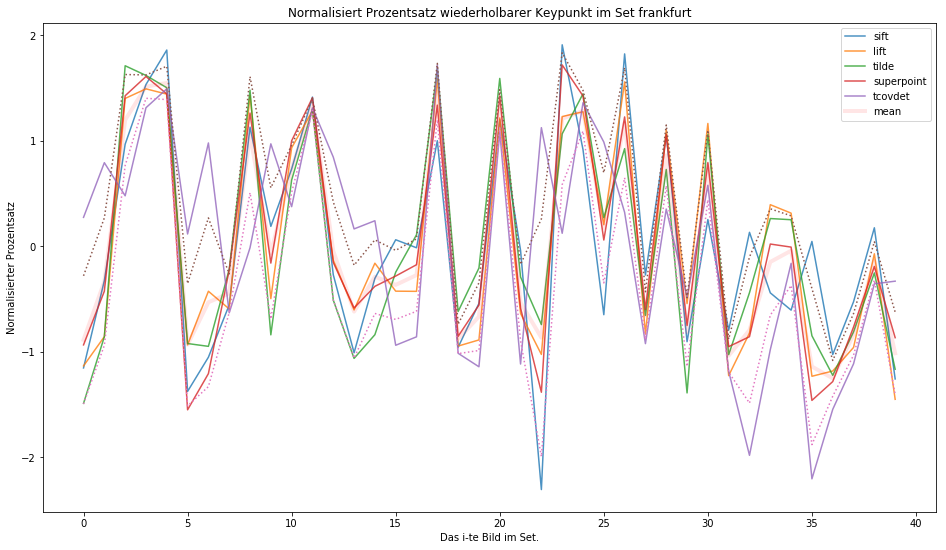

In [48]:
plot_perc_matching_kpts_for_e_normalized(
    collection_name, set_name, data)

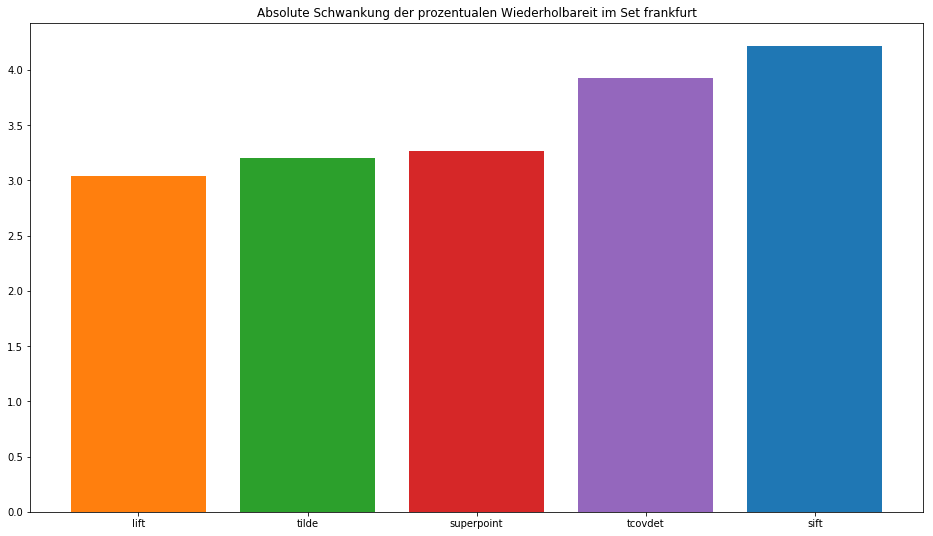

In [49]:
plot_difference_in_variance_for_matching_kpts_for_e(
    collection_name, set_name, data, COLOR_SCHEME)

### Beobachtung
- Alle Detektoren arbeiten hier sehr ähnlich und unterscheiden sich nur in einem Offset an wiedergefundenen Keypunkten.
- In diesem Set glänzt SuperPoint als mit den besten Wiederholbarkeitswerten.
- Die schlechteste Wiederholbarkeit besitzt in diesem Set eindeutig TCovDet$_{1k}$. Besonders bei zwei Bildern im Set lässt dessen Performanz deutlich nach.
- Letzendlich hat jedoch SIFT die größte Varianz bei der Wiederholbkeit seiner Keypunkte; TCovDet$_{1k}$ nimmt deutlich den zweitschlechtesten Platz ein.
- Die anderen drei Detektoren besitzen fast die gleiche Varianz.

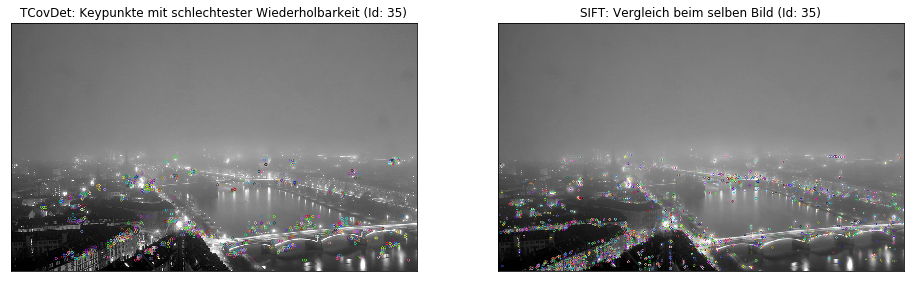

In [50]:
stats = data['tcovdet'][collection_name][set_name]['stats_perc_matching_kpts_for_e_1']
idx_min = stats['y_normalized'].argsort()
draw_image_with_min_num_kpts_for_det(
    collection_name, 
    set_name, 
    'tcovdet',  
    'sift', 
    data,
    idx=idx_min[0],
    titles=['TCovDet: Keypunkte mit schlechtester Wiederholbarkeit (Id: {})', 
           'SIFT: Vergleich beim selben Bild (Id: {})'])

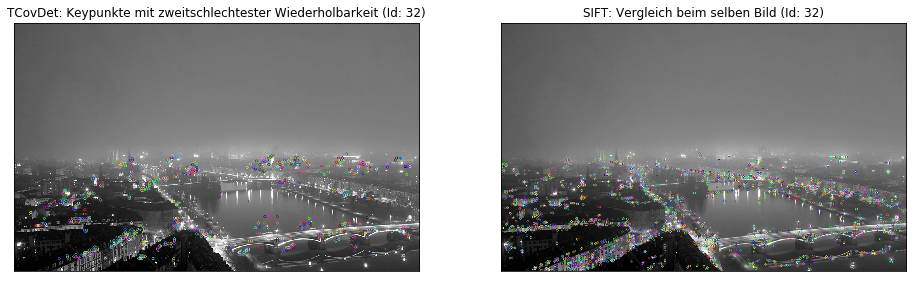

In [51]:
draw_image_with_min_num_kpts_for_det(
    collection_name, 
    set_name, 
    'tcovdet',  
    'sift', 
    data,
    idx=idx_min[1],
    titles=['TCovDet: Keypunkte mit zweitschlechtester Wiederholbarkeit (Id: {})', 
           'SIFT: Vergleich beim selben Bild (Id: {})'])

### Mexico

In [52]:
set_name = 'mexico'

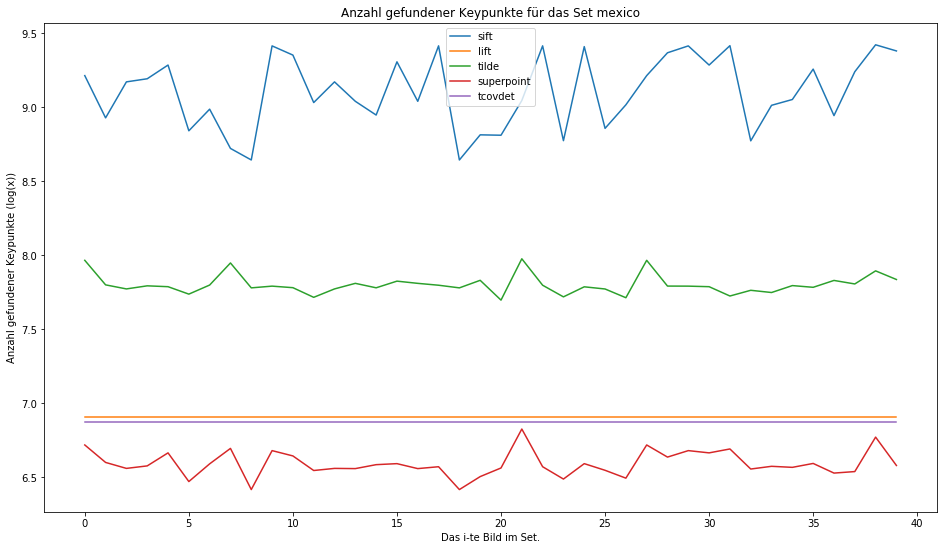

In [53]:
plot_num_kpts_for_set(collection_name, set_name, data)

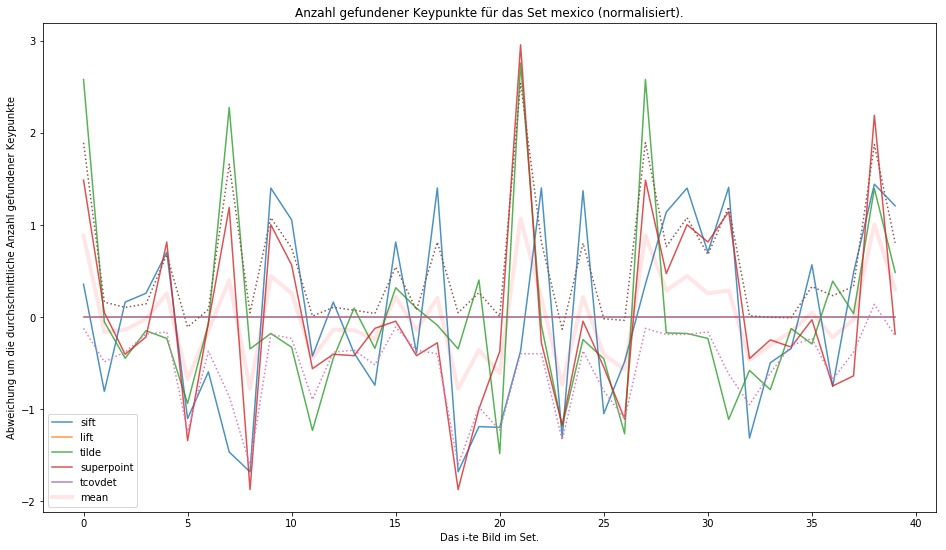

In [54]:
plot_num_kpts_for_set_normalized(collection_name, set_name, data)

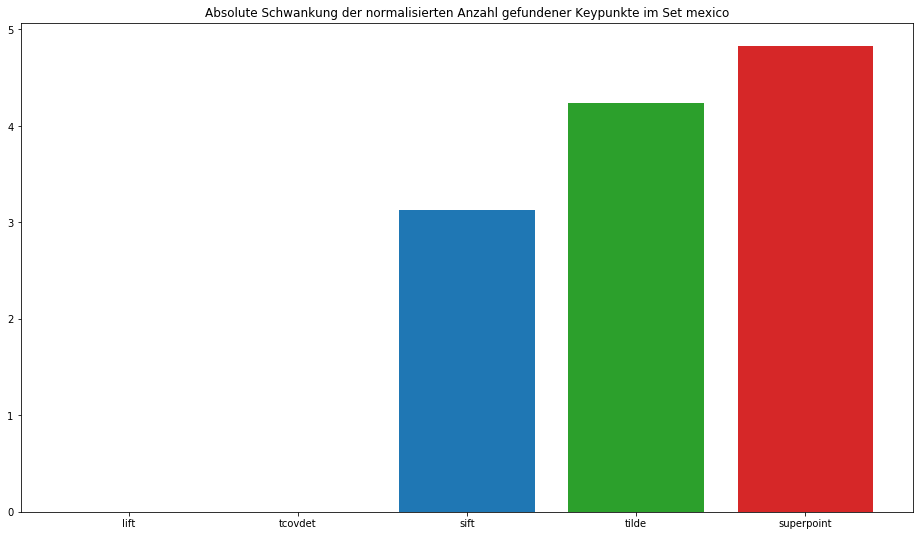

In [55]:
plot_difference_in_variance_for_num_kpts(collection_name, set_name, data, COLOR_SCHEME)

### Beobachtung
- Auch hier liegt SIFT bei der gefundenen Anzahl von Keypunkten deutlich vor den adneren Detektoren.
- Wie im Set Chamonix hat SuperPoint ist die Anzahl der gefundenen Keypunkte für SuperPoint unterhalb der Anzahl von TCovDet$_{1k}$ und LIFT$_{1000}$.
- Selbst mit wenigen Keypunkten schwankt die Zahl der wiederholbaren Keypunkten bei SuperPoint deutlich, stärker sogar als bei SIFT und TILDE.

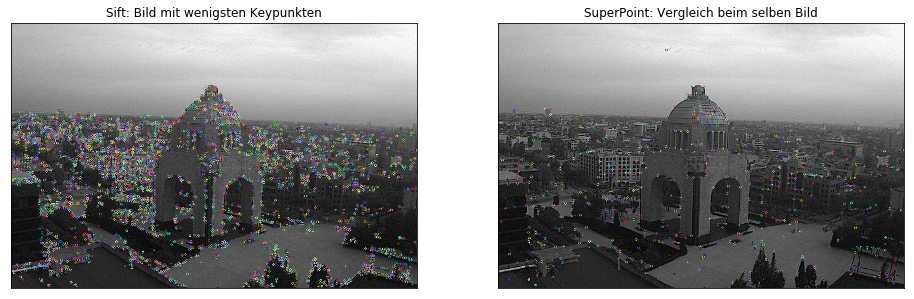

In [56]:
draw_image_with_min_num_kpts_for_det(
    collection_name, 
    set_name, 
    'sift',  
    'superpoint', 
    data,
    titles=['Sift: Bild mit wenigsten Keypunkten', 
           'SuperPoint: Vergleich beim selben Bild'])

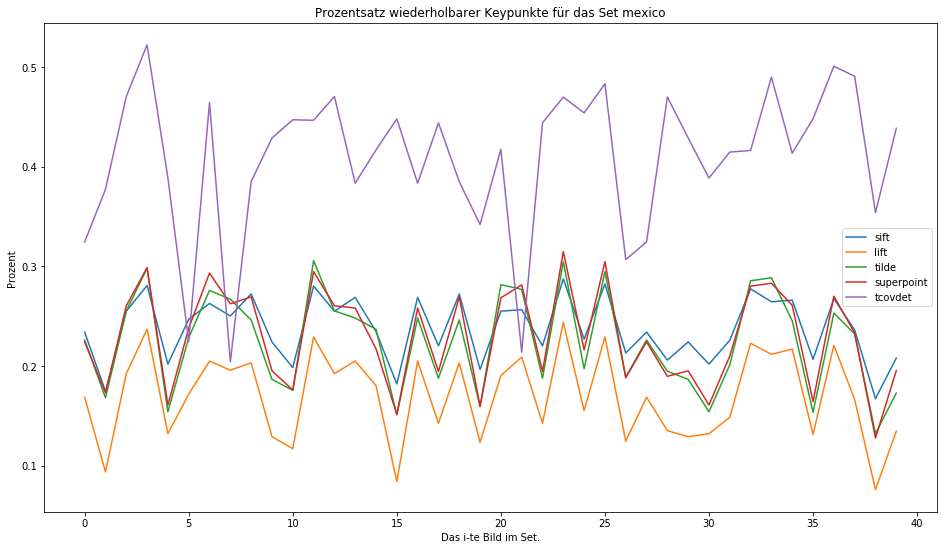

In [57]:
plot_perc_matching_kpts_for_e(collection_name, set_name, data)

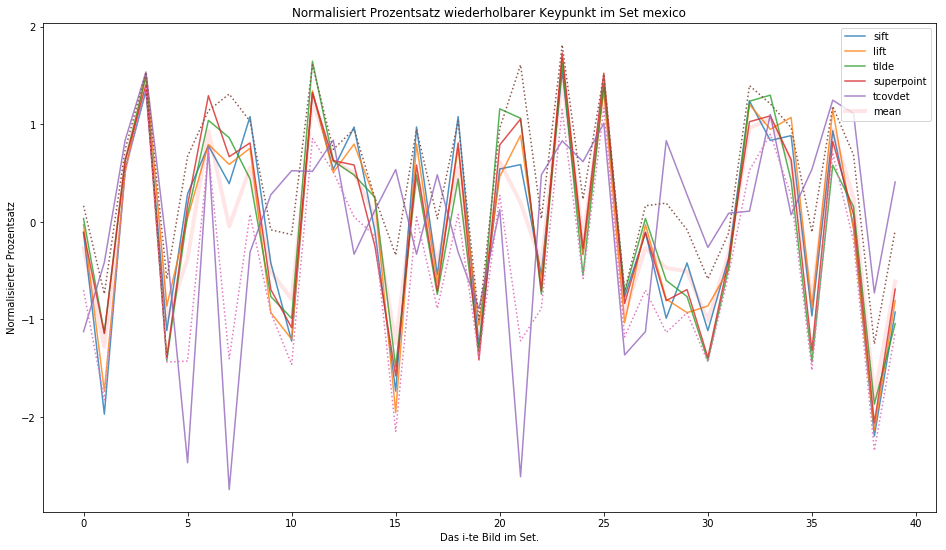

In [58]:
plot_perc_matching_kpts_for_e_normalized(
    collection_name, set_name, data)

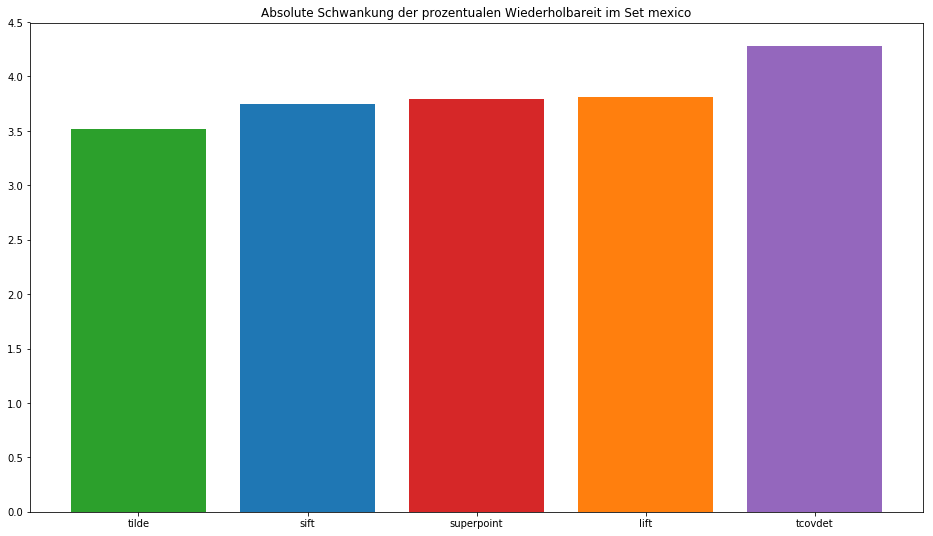

In [59]:
plot_difference_in_variance_for_matching_kpts_for_e(
    collection_name, set_name, data, COLOR_SCHEME)

### Beobachtung
- SIFT, SuperPoint und TILDe performen bei der Wiederholbkeit auf diesem Set gleich, ihre Wiederholbarkeit liegt zwischen 20% und 30%.
- Zwei Sachen sind daran interessant: 1) Obwohl SuperPoint eine sehr hohe Varianz an Keypunkten in dem Bilderset hat, kann es die gefundenen Punkte doch rect konstant wiederholen. 2) Obwohl SIFT deutlich mehr Keypunkte gefunden hat als alle anderen ist es bei der Wiederholung der Keypunkte in anderen Bilden konstanter als SuperPoint.
- Trotz gleicher Azahl Keypunkte wie TCovDet$_{1k}$ ist die Wiederholbarkeit der LIFT$_{1k}$ Keypunkte am schlechtesten.
- TCovDet$_{1k}$ hat wiederherum die besten Werte bei Wiederholbarkeit, aber die schlechtesten in Konsistenz. Diese werden durch die drei Negativespizen bei den Bildern 6, 8 und 22 veursacht, bei denen die anderen Detektoren deutlich besser abschneiden.
- Anhand der Bilder kann man erkennen, dass sich TCovDet$_{1k}$ bei seinen schlechtbewertesten Bildern deutlich auf die Wolken fokussiert hat, die natürlich bei den anderen Bildern mit besserem Wetter nicht wiedergefunden werden können.

In [60]:
idx_worst_tcovdet = data['tcovdet'][collection_name][set_name]['stats_perc_matching_kpts_for_e_1']['y_normalized'].argsort()

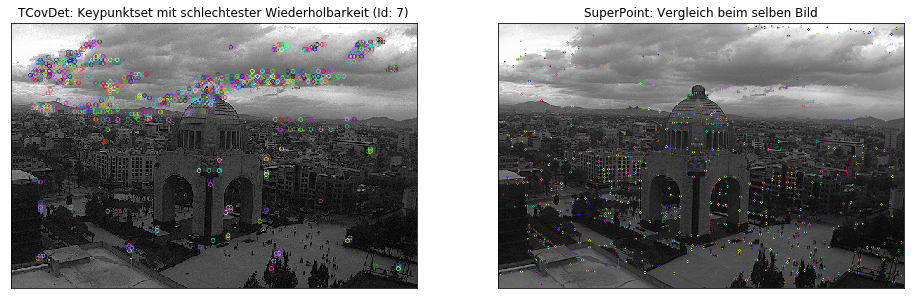

In [61]:
draw_image_with_min_num_kpts_for_det(
    collection_name, 
    set_name, 
    'tcovdet',  
    'superpoint', 
    data,
    idx=idx_worst_tcovdet[0],
    titles=['TCovDet: Keypunktset mit schlechtester Wiederholbarkeit (Id: {})', 
           'SuperPoint: Vergleich beim selben Bild'])

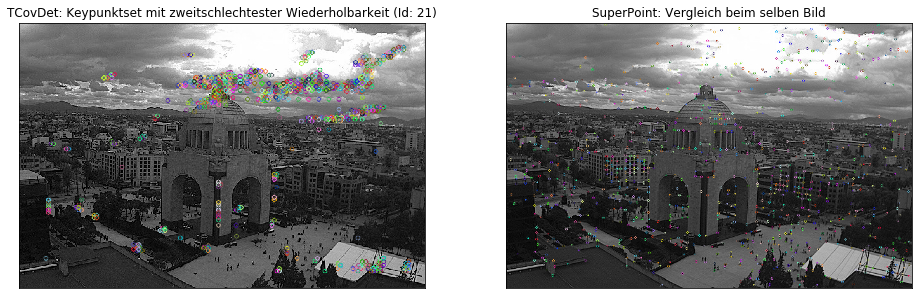

In [62]:
draw_image_with_min_num_kpts_for_det(
    collection_name, 
    set_name, 
    'tcovdet',  
    'superpoint', 
    data,
    idx=idx_worst_tcovdet[1],
    titles=['TCovDet: Keypunktset mit zweitschlechtester Wiederholbarkeit (Id: {})', 
           'SuperPoint: Vergleich beim selben Bild'])

### Panorama

In [63]:
set_name = 'panorama'

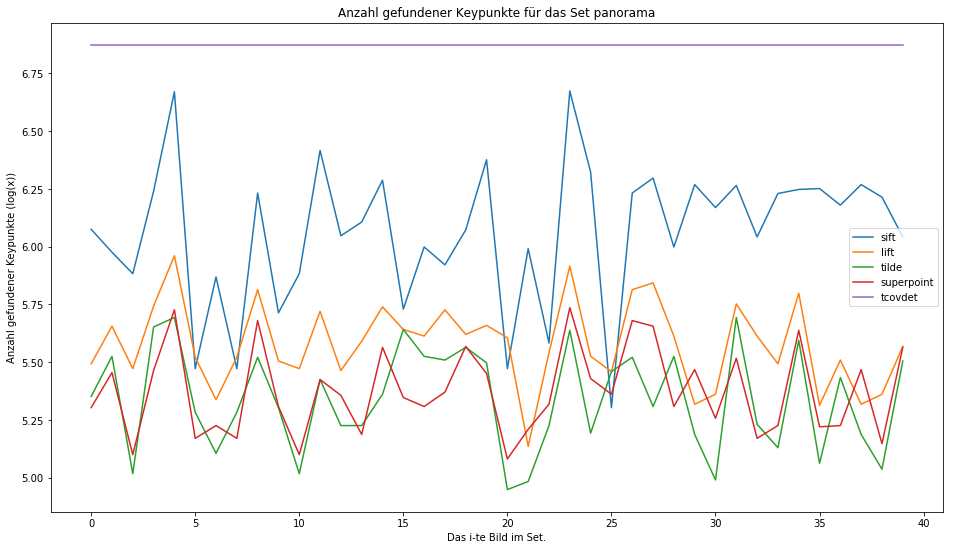

In [64]:
plot_num_kpts_for_set(collection_name, set_name, data)

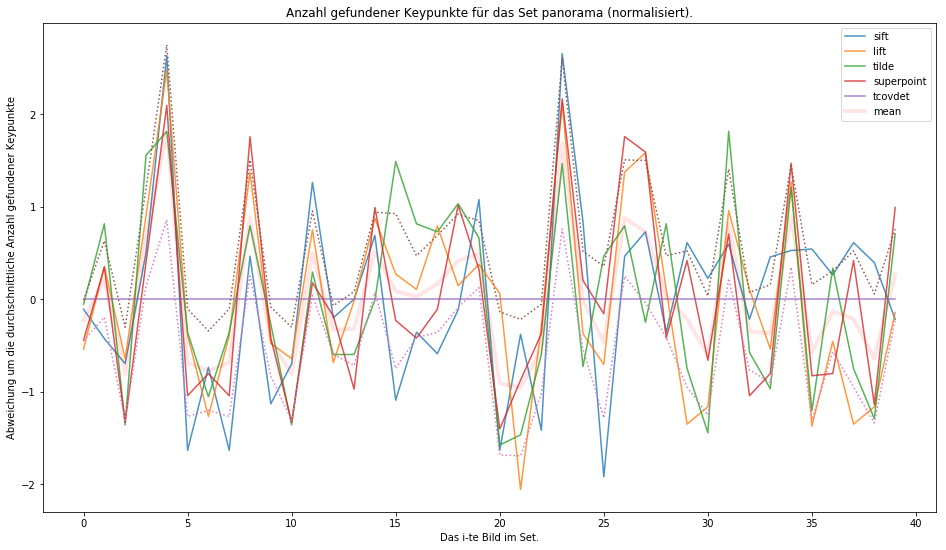

In [65]:
plot_num_kpts_for_set_normalized(collection_name, set_name, data)

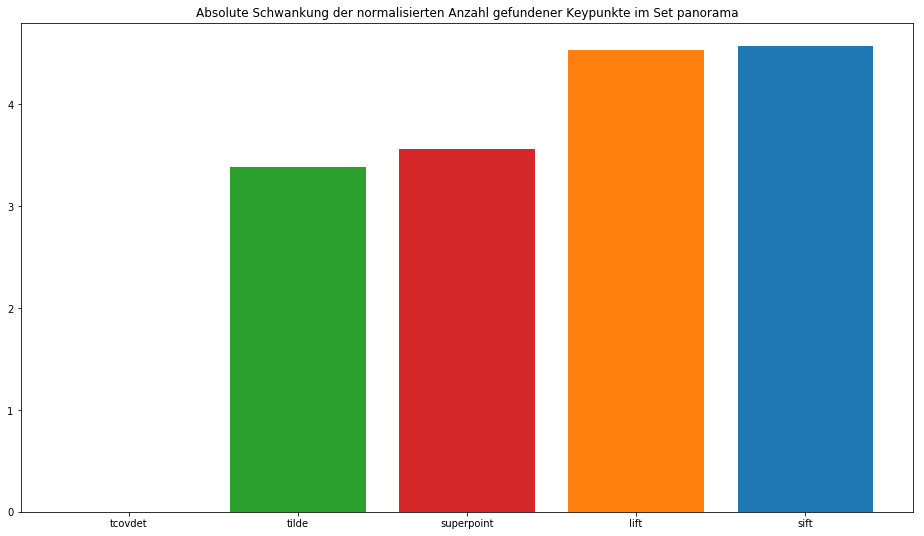

In [66]:
plot_difference_in_variance_for_num_kpts(
    collection_name, set_name, data, COLOR_SCHEME)

### Beobachtung
- Dieses Set stellt eine große Herausforderung für alle Detektoren da, die generelle Anzahl an gefundenen Keypunkten ist bedeutend geringer für alle Detektoren außer TCovDet$_{1k}$, welches in dem Set deutlich führt.
- Sift kann zwar den zweiten Platz einholen, doch der Vorsprung ist gegenüber den anderen Bildersets deutlich zurückgegagen.
- TILDE, SuperPoint und LIFT$_{1k}$ dagegen liegen fast gleich auf, wobei LIFT$_{1k}$ von denen dreien zumindest in absoluter Anzahl Keypunkte klar führt.
- Bei der Konsistenz der Auffindung der Keypunkte hingegen schwanken LIFT$_{1k}$ und SIFT am stärksten.
- Interessant ist, dass sich TILDE und SIFT gerade bei den Bildern 16 bis 18 gegenteilig verhalten: Während SIFT durchschnittlich schlechter auf diesen Bilder performt, findet TILDE durchschnittlich mehr Keypunkt in diesem Bereich. An den Bildern unten ist jedoch zu erkennen, dass TILDE vergleichsweise viele Keypunkte in der stark akzentuierten Wolkendecke findet, der Wert ist also mit Vorsicht zu genießen.

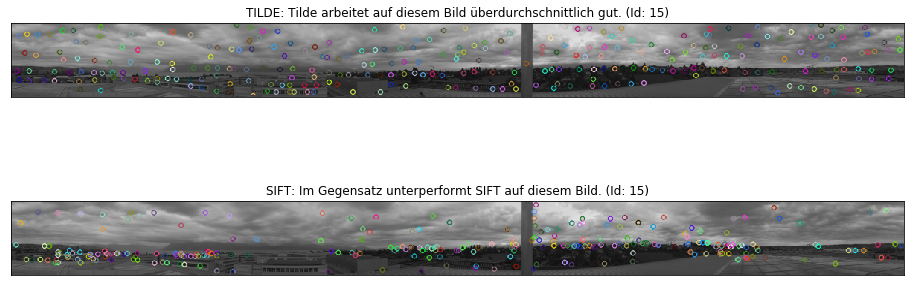

In [67]:
draw_image_with_min_num_kpts_for_det(
    collection_name, 
    set_name, 
    'tilde',  
    'sift', 
    data,
    idx=15,
    direction='vertical',
    titles=['TILDE: Tilde arbeitet auf diesem Bild überdurchschnittlich gut. (Id: {})', 
           'SIFT: Im Gegensatz unterperformt SIFT auf diesem Bild. (Id: {})'])

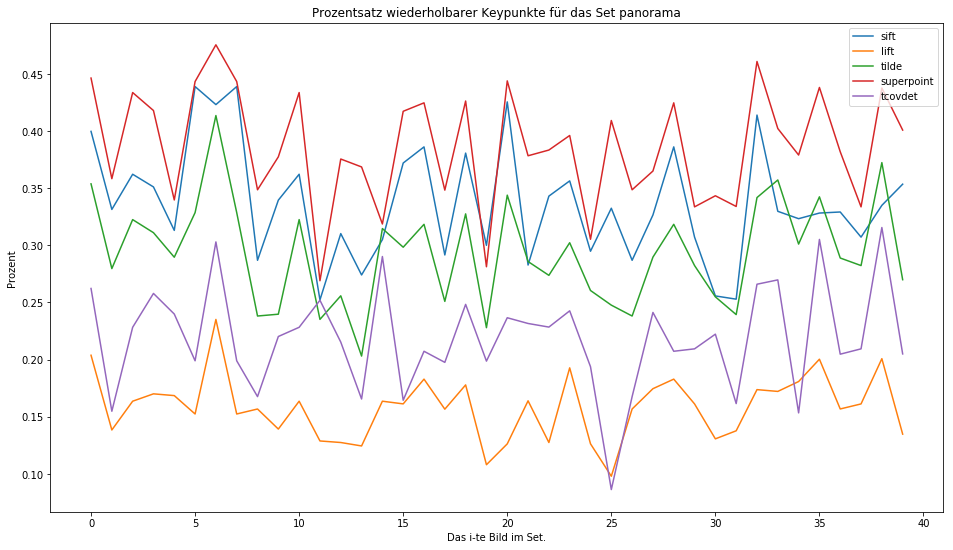

In [68]:
plot_perc_matching_kpts_for_e(collection_name, set_name, data)

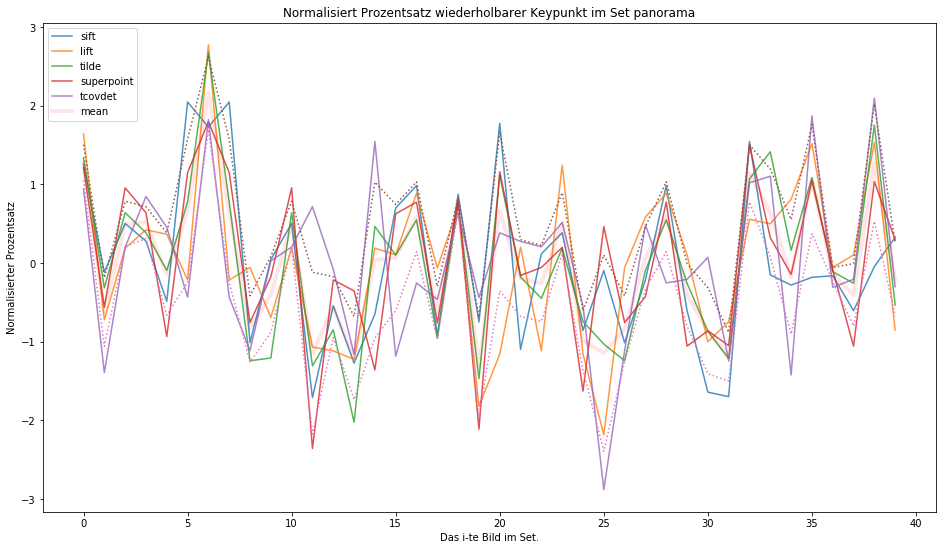

In [69]:
plot_perc_matching_kpts_for_e_normalized(
    collection_name, set_name, data)

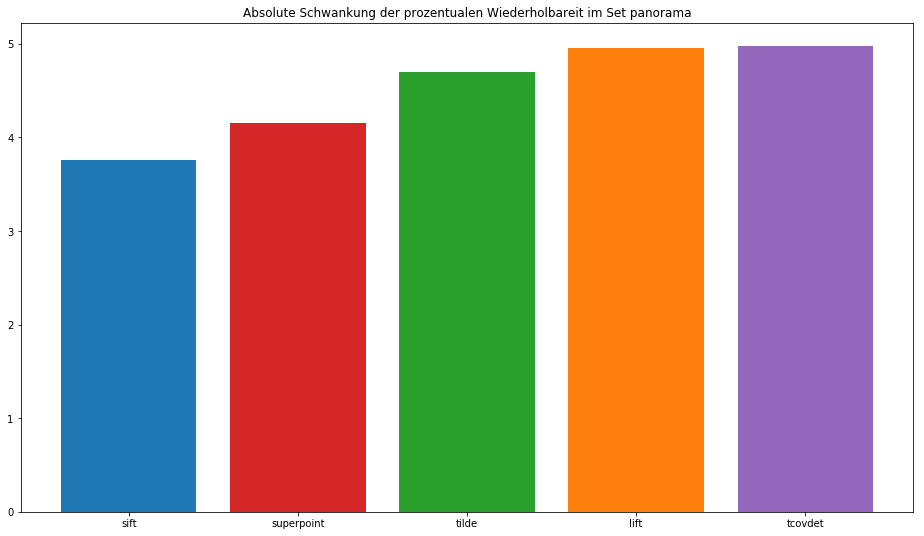

In [70]:
plot_difference_in_variance_for_matching_kpts_for_e(
    collection_name, set_name, data, COLOR_SCHEME)

### Beobachtung 
- Bei der Wiederholbarkeit zeigt sich ein interessantes Bild: SuperPoint performt hier am besten, teilweise mit bis zu über 45% Wiederholbarkeit, während LIFT$_{1k}$ das Schlusslicht bildet.
- Selbst der recht gut operierende TCovDet$_{1k}$ Detektor kommt bei diesem Set an seine Grenzen und belegt den vorletzten Platz.
- Gerade beim 26. Bild fällt die Performanz von TCovDet$_{1k}$ sogar unter die von LIFT$_{1k}$.
- Der Grund lässt sich an dem entsprechenden Bild unten gut erkennen: Von den 1000 zu Verfügungen stehend Keypunkten verwendet TCovDet$_{1k}$ einen Großteil in dem stark konstrastreichen Bereich der aufgehenden Sonne. Da die meisten Bilder jedoch entweder einen klaren, sonnenfreien Himmel oder einen total bedeckten Himmel zeigen, können viele dieser Punkte nicht reproziert werden.

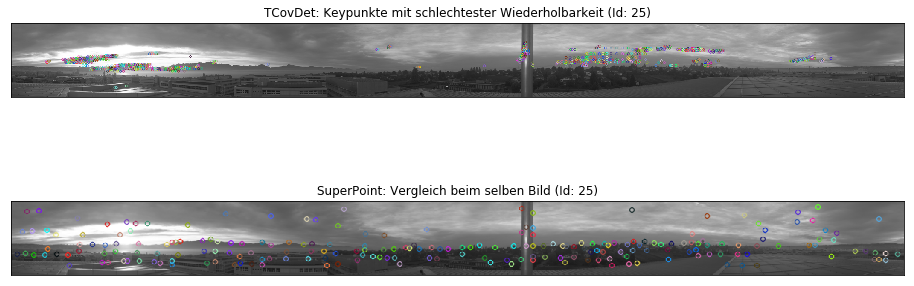

In [71]:
worst_idx_tcovdet = data['tcovdet'][collection_name][set_name]['stats_perc_matching_kpts_for_e_1']['y_normalized'].argsort()
draw_image_with_min_num_kpts_for_det(
    collection_name, 
    set_name, 
    'tcovdet',  
    'superpoint', 
    data,
    idx=worst_idx_tcovdet[0],
    direction='vertical',
    titles=['TCovDet: Keypunkte mit schlechtester Wiederholbarkeit (Id: {})', 
           'SuperPoint: Vergleich beim selben Bild (Id: {})'])

# St. Louis

In [72]:
set_name ='stlouis'

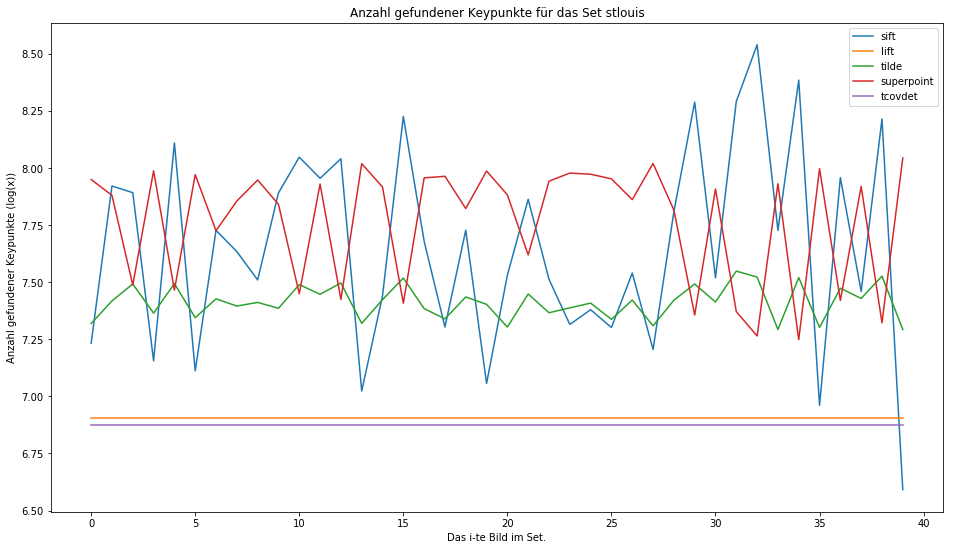

In [73]:
plot_num_kpts_for_set(collection_name, set_name, data)

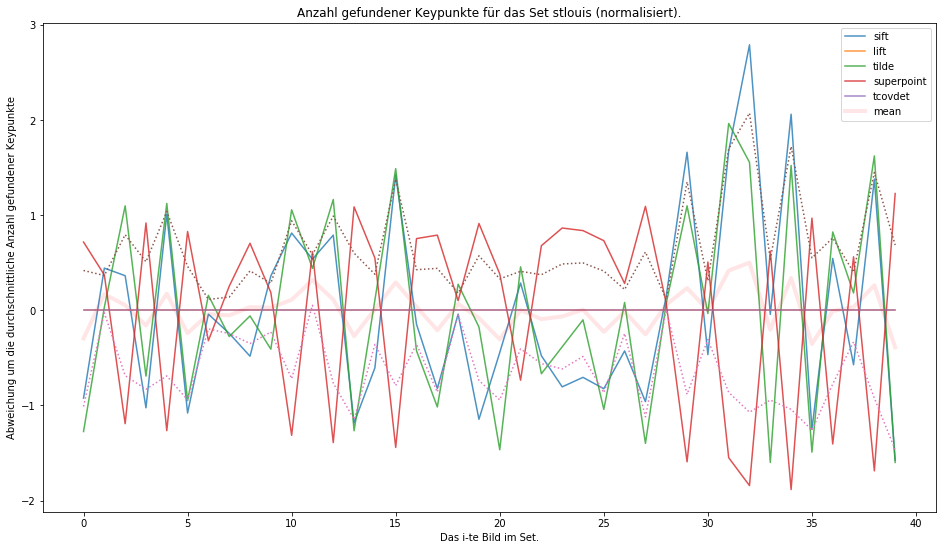

In [74]:
plot_num_kpts_for_set_normalized(collection_name, set_name, data)

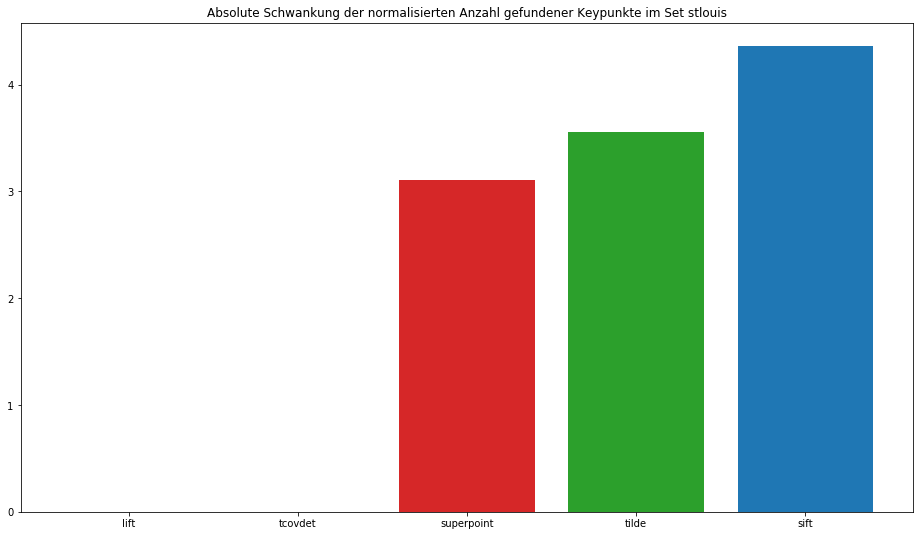

In [75]:
plot_difference_in_variance_for_num_kpts(collection_name, set_name, data, COLOR_SCHEME)

### Beobachtung:
- TCovDet$_{1k}$ und TILDE$_{1k}$ arbeiten auf diesen Set konstant und könnten stets die eingestellte Anzahl Keypunkte finden.
- SIFT und SuperPoint wechseln sich je nach Bild ab, wenn es um die größte Anzahl gefundener Keypunkte geht.
- Sehr auffällig wie schon im Chamonix Set ist, dass sich SIFT und SuperPoint beim Auffinden der Keypunkte sehr reziprok verhalten: Dort wo SIFT besonders gut Keypunkte auffindet, hat SuperPoint Schwierigkeiten und andersherum.
- TILDE liegt bei diesem Set genau im Mittelfeld und übertrifft teilweise die beiden erstplatzierten Detektoren dank deren starken Schwankungen beim Auffinden der Keypunkte.
- Obwohl sowohl SuperPoint und SIFT beide eine starke Varianz in der Zahl der gefundenen Keypunkte aufweisen, performt hier überraschenderweise SuperPoint im Durchschnitt besser als TILDE.
- Das Bild mit der Id 34 bereitet SuperPoint die meisten Schwierigkeiten, während SIFT damit am besten operieren kann. Auffällig ist hier, dass SuperPoint den gebäudefreien Himmelsbereich in der rechten oberen Ecke präferiert, während sich SIFT auf den Baum auf der linken Seite fokussiert und dort viele Features erkennt.

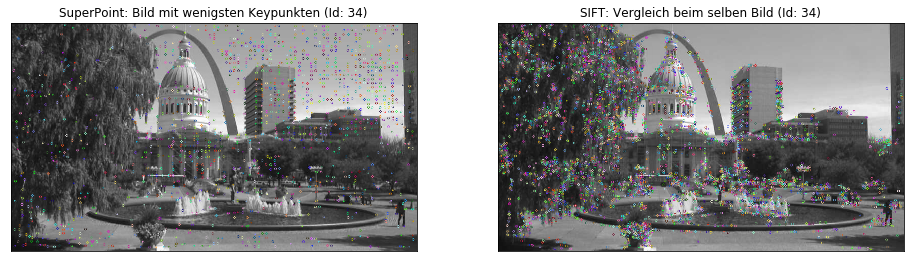

In [76]:
worst_idx = data['superpoint'][collection_name][set_name]['stats_num_kpts']['y'].argsort()
draw_image_with_min_num_kpts_for_det(
    collection_name, 
    set_name, 
    'superpoint',  
    'sift', 
    data,
    idx=worst_idx[0],
    titles=['SuperPoint: Bild mit wenigsten Keypunkten (Id: {})', 
           'SIFT: Vergleich beim selben Bild (Id: {})'])

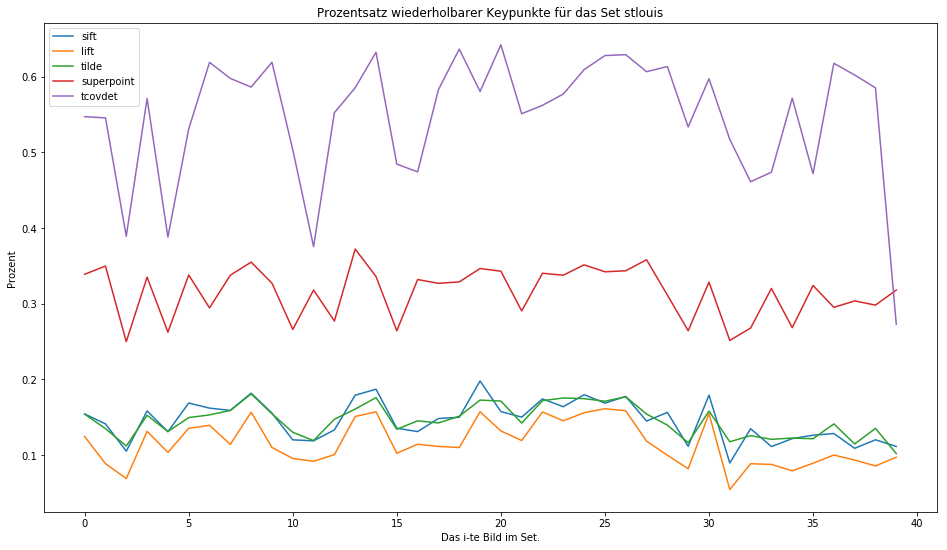

In [77]:
plot_perc_matching_kpts_for_e(collection_name, set_name, data)

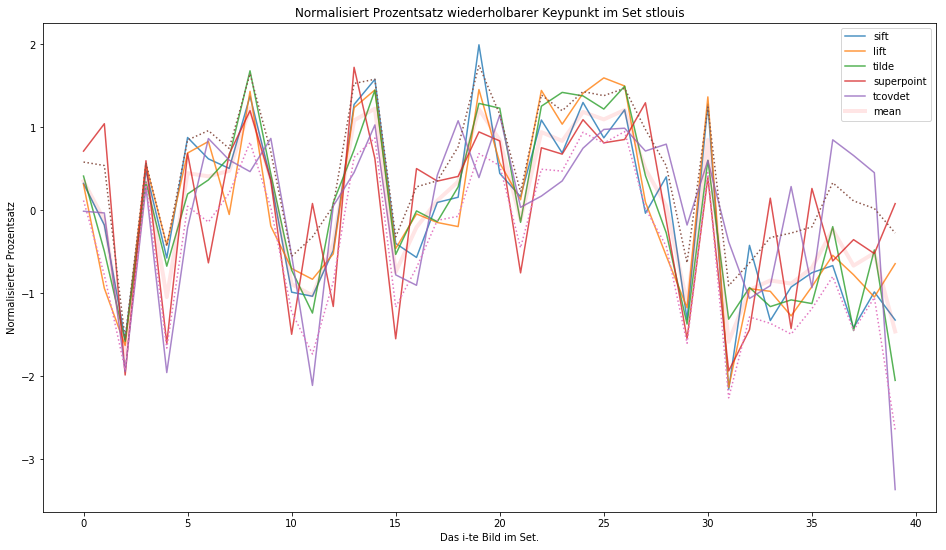

In [78]:
plot_perc_matching_kpts_for_e_normalized(
    collection_name, set_name, data)

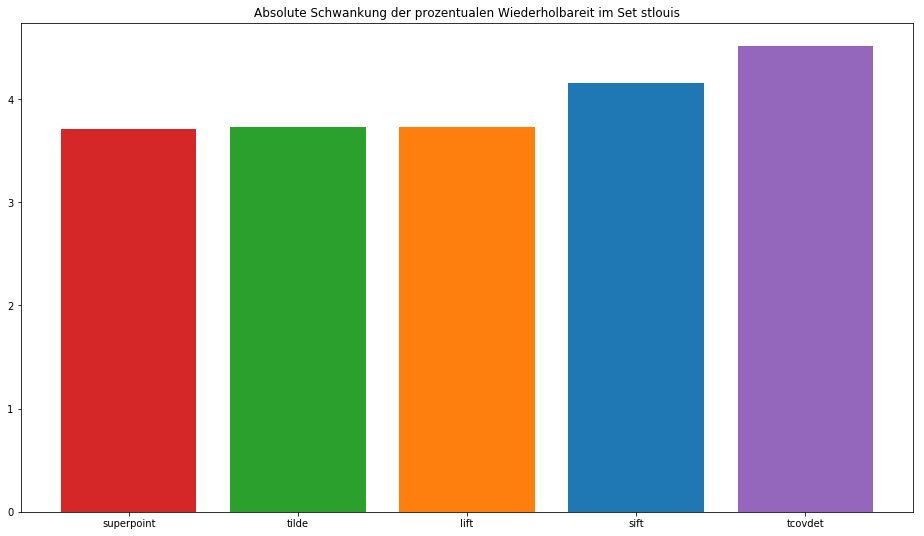

In [79]:
plot_difference_in_variance_for_matching_kpts_for_e(
    collection_name, set_name, data, COLOR_SCHEME)

### Beobachtung
- LIFT$_{1k}$, SIFT und TILDE haben große Probleme, die gefundenen Keypunkte in den anderen Bildern zu reproduzieren. und liegen durchweg unter 20%
- SuperPoint belegt den zweiten Platz bei der Wiederholbarkeit und weist die deutlich niedrigsten Schwankungen in den Wiederholbarkeitswerten.
- TCovDet$_{1k}$ liefert bei diesem Set mit Abstand die reprozierbarstens Keypunkte, mit einer Genauigkeit von bis zu 64,4%.
- Das letzte Bild lässt TCovDet$_{1k}$ jedoch übermäßig stark unterperfomieren. Die dort gewonnen Keypunkte können nur zu 27% bei anderen Bildern wiedergefunden werden. Der Wert liegt zwar noch deutlich über den von LIFT$_{1k}$, SIFT und TILDE, fällt aber unter dem von SuperPoint.
- Beim Betrachten des Bildes erkennt man, dass TCovDet$_{1k}$ den Großteil der Keypunkte an drei Stellen im Bild gefunden hat und den restlichen Bereich nicht ignoriert, wohingegen Superpoint fast gleichmäßig Keypunkte über das Bild verteilt findet.
- Der starke Prozentsatzabfall führt zur höchsten Varianz für TCovDet$_{1k}$

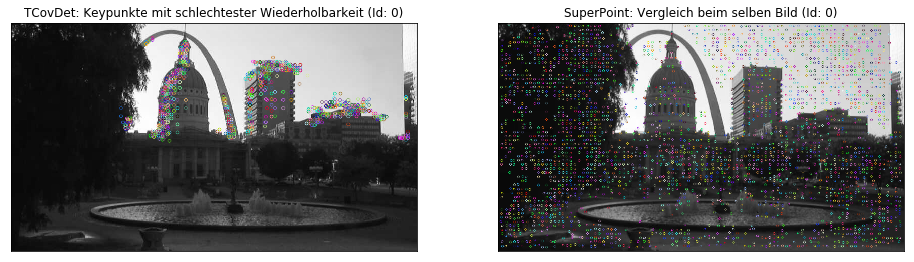

In [80]:
worst_idx = data['tcovdet'][collection_name][set_name]['stats_num_kpts']['y'].argsort()
draw_image_with_min_num_kpts_for_det(
    collection_name, 
    set_name, 
    'tcovdet',  
    'superpoint', 
    data,
    idx=worst_idx[0],
    titles=['TCovDet: Keypunkte mit schlechtester Wiederholbarkeit (Id: {})', 
           'SuperPoint: Vergleich beim selben Bild (Id: {})'])

## Zusammenfassung

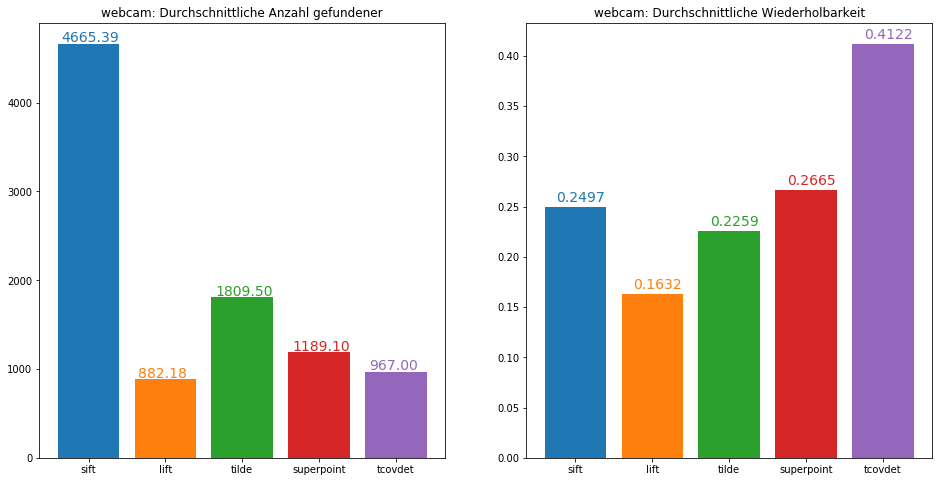

In [81]:
plot_comparison(collection_name, data, COLOR_SCHEME)

#### Beobachtung
- In allen Sets liegt von der puren Anzahl gefundener Keypunkten SIFT ganz klar vorne.
- TILDE gelangt auf den zweiten Platz durch eine konsistente Anzahl an Keypunkten, die jedoch deutlich geringer ist als die von SIFT und wesentlich näher and den verbleibenden drei Detektoren liegt.
- Durch die Beschränkung auf 1000 Keypunkte fallen LIFT$_{1k}$ und TCovDet$_{1k}$ auf die hinteren Plätze, was nicht weiter verwunderlich ist.
- Interessant ist, dass SuperPoint nicht dieser Beschränkung unterliegt, jedoch nur unwesentlich mehr Keypunkte findet.
- Bei der Wiederholbarkeit der Keypunkte zeichnet sich ein anderes Bild: Hier liegt klar TCovDet$_{1k}$ mit über 41% vorne.
- Alle anderen Detektoren schaffen dort gerade einmal die Hälft, bis auf LIFT$_{1k}$, der sogar darunter liegt.
- Interessant sind auf jeden Fall auch die Werte von SIFT und SuperPoint, die sehr nahe beianeinander liegen, obwohl oder gerade weil SIFT die vierfache Anzahl an Keypunkten ge